# Анализ факторов, влияющих на успеваемость студентов

## Основная информация о проекте

**Цель исследования** - выявление факторов, влияющих на успеваемость студентов, прогнозирование успеваемости студентов, поступающих в университеты Нигерии, разработка решений для улучшения результатов. 

<span style="color:blue"> (В процессе)</span> **Задачи исследования**:
- Выполнить предобработку данных: анализ пропусков, дубликатов, количественных и категориальных данных, категоризация;
- Провести исследовательский анализ данных: 

**Источники исследования**: датасет "Students Performance in 2024 JAMB", созданный с использованием статистики экзамена JAMB 2024 года для прогнозирования успеваемости студентов, поступающих в университеты Нигерии. 

**Описание датасета:** содержит 17 столбцов и 5000 записей. Приведем описание столбцов:

* `JAMB_Score` - оценка, полученная студентом на экзамене JAMB. Тип данных: числовой дискретный;
* `Study_Hours_Per_Week` - количество часов, которые студент посвящает учебе в неделю. Тип данных: числовой дискретный;
* `Attendance_Rate` - процент дней, которые студент посещал школу в течение учебного года. Тип данных: числовой дискретный;
* `Teacher_Quality` - качество преподавания в школе, оцениваемое по шкале от 1 до 5. Тип данных: числовой дискретный;
* `Distance_To_School` - расстояние, которое преодолевает студент, чтобы добраться до школы. Тип данных: числовой непрерывный;
* `School_Type` - тип школы, которую посещает студент. Тип данных: категориальный номинальный;
* `School_Location` - местоположение школы. Тип данных: категориальный номинальный;
* `Extra_Tutorials` - наличие у студента допонительных учебных пособий. Тип данных: категориальный бинарный;
* `Access_To_Learning_Materials` - наличие у студента доступа к учебникам и интернету. Тип данных: категориальный бинарный;
* `Parent_Involvement` - степень вовлеченности родителей в обучение. Тип данных: категориальный ранговый;
* `IT_Knowledge` - умение учащегося пользоваться компьютером. Тип данных: категориальный ранговый;
* `Student_ID` - идентификатор студента. Тип данных: числовой дискретный;
* `Age` - возраст студента. Тип данных: числовой дискретный;
* `Gender` - пол студента. Тип данных: категориальный бинарный;
* `Socioeconomic_Status` - социально-экономическое положение семьи студента. Тип данных: категориальный бинарный;
* `Parent_Education_Level` - уровень образования родителей студента. Тип данных: категориальный ранговый;
* `Assignments_Completed` - уровень выполнения заданий студентом. Тип данных: числовой ранговый. 

<span style="color:blue"> (В процессе)</span> **Оглавление**:
* [Подготовка к работе и знакомство с датасетом](#first-bullet)
* [Предобработка данных](#second-bullet)
   * [Обработка пропущенных значений](#nan-bullet)
* [Исследовательский анализ данных](#third-bullet)
   * [Распределение числовых признаков](#num-bullet)
   * [Исследование связи между числовыми признаками](#num2-bullet)
   * [Распределение категориальных признаков](#cat-bullet)
   * [Исследование связи между признаками](#cat2-bullet)
   * [Исследование влияния признаков на результат экзамена](#jamb-bullet)
   * [Матрица корелляций](#corr-bullet)
* [Приложение](#last-bullet)

## Подготовка к работе и знакомство с датасетом <a class="anchor" id="first-bullet"></a>

In [1]:
# импорт необходимых для работы библиотек

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import shapiro, normaltest, anderson
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import KMeans
import itertools

In [2]:
# улучшение качества графиков

%config InlineBackend.figure_format = 'retina'

In [3]:
# отключение предупреждений в итоговом отчёте

import warnings
warnings.filterwarnings('ignore')

In [4]:
# выгрузка датасета

jamb = pd.read_csv('/Users/mimikhailova/Downloads/jamb_exam_results.csv')

In [5]:
# функция для получения общей информации о датасете

def general_info(data):
    try:
        print('Первые пять строк датасета:')
        display(data.head(5))
        print('\nОбщая информация о датасете:\n')
        display(data.info())
        print('\nCтатистические характеристики количественных признаков:')
        display(data.describe().transpose())
        print(f'\nКоличество явных дубликатов: {data.duplicated().sum()}')
        print(f'\nКоличество пропусков:\n{data.isna().sum()}')
        
        pass_values(data)
        
    except:
        print(f'Произошла ошибка в основной функции')
    
def pass_values(data):
    try:
        pass_values = (data.isna().mean()*100).sort_values(ascending=True)
        plt.figure(figsize=(10,5))
        plt.barh(pass_values.index, pass_values, color='#00B7C2', alpha=0.7)
        plt.title('Визуализация пропущенных значений в процентах\n', fontsize=14)
        plt.xlabel('\nПроцент пропусков', fontsize=12)
        plt.ylabel('Столбцы таблицы\n', fontsize=12)
        plt.xlim(0, 100)
        for i, v in enumerate(pass_values):
            plt.text(v, i, f'{v:.2f}%', color='#01204E', va='center')
    except:
        print('Пропусков не осталось, или произошла ошибка в функции pass_values')

Первые пять строк датасета:


,JAMB_Score,Study_Hours_Per_Week,Attendance_Rate,Teacher_Quality,Distance_To_School,School_Type,School_Location,Extra_Tutorials,Access_To_Learning_Materials,Parent_Involvement,IT_Knowledge,Student_ID,Age,Gender,Socioeconomic_Status,Parent_Education_Level,Assignments_Completed
0,192,22,78,4,12.4,Public,Urban,Yes,Yes,High,Medium,1,17,Male,Low,Tertiary,2
1,207,14,88,4,2.7,Public,Rural,No,Yes,High,High,2,15,Male,High,NaN,1
2,182,29,87,2,9.6,Public,Rural,Yes,Yes,High,Medium,3,20,Female,High,Tertiary,2
3,210,29,99,2,2.6,Public,Urban,No,Yes,Medium,High,4,22,Female,Medium,Tertiary,1
4,199,12,98,3,8.8,Public,Urban,No,Yes,Medium,Medium,5,22,Female,Medium,Tertiary,1



Общая информация о датасете:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   JAMB_Score                    5000 non-null   int64  
 1   Study_Hours_Per_Week          5000 non-null   int64  
 2   Attendance_Rate               5000 non-null   int64  
 3   Teacher_Quality               5000 non-null   int64  
 4   Distance_To_School            5000 non-null   float64
 5   School_Type                   5000 non-null   object 
 6   School_Location               5000 non-null   object 
 7   Extra_Tutorials               5000 non-null   object 
 8   Access_To_Learning_Materials  5000 non-null   object 
 9   Parent_Involvement            5000 non-null   object 
 10  IT_Knowledge                  5000 non-null   object 
 11  Student_ID                    5000 non-null   int64  
 12  Age                           5

None


Cтатистические характеристики количественных признаков:


,count,mean,std,min,25%,50%,75%,max
JAMB_Score,5000.0,174.07460,47.616477,100.0,135.00,170.0,209.00,367.0
Study_Hours_Per_Week,5000.0,19.52120,9.634569,0.0,13.00,19.0,26.00,40.0
Attendance_Rate,5000.0,84.23520,9.485688,50.0,78.00,84.0,91.00,100.0
Teacher_Quality,5000.0,2.52140,0.985564,1.0,2.00,2.0,3.00,5.0
Distance_To_School,5000.0,10.00546,4.820221,0.0,6.60,10.0,13.40,20.0
Student_ID,5000.0,2500.50000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,18.44580,2.301504,15.0,16.00,18.0,20.00,22.0
Assignments_Completed,5000.0,1.80460,0.992076,1.0,1.00,1.0,2.00,5.0



Количество явных дубликатов: 0

Количество пропусков:
JAMB_Score                        0
Study_Hours_Per_Week              0
Attendance_Rate                   0
Teacher_Quality                   0
Distance_To_School                0
School_Type                       0
School_Location                   0
Extra_Tutorials                   0
Access_To_Learning_Materials      0
Parent_Involvement                0
IT_Knowledge                      0
Student_ID                        0
Age                               0
Gender                            0
Socioeconomic_Status              0
Parent_Education_Level          891
Assignments_Completed             0
dtype: int64


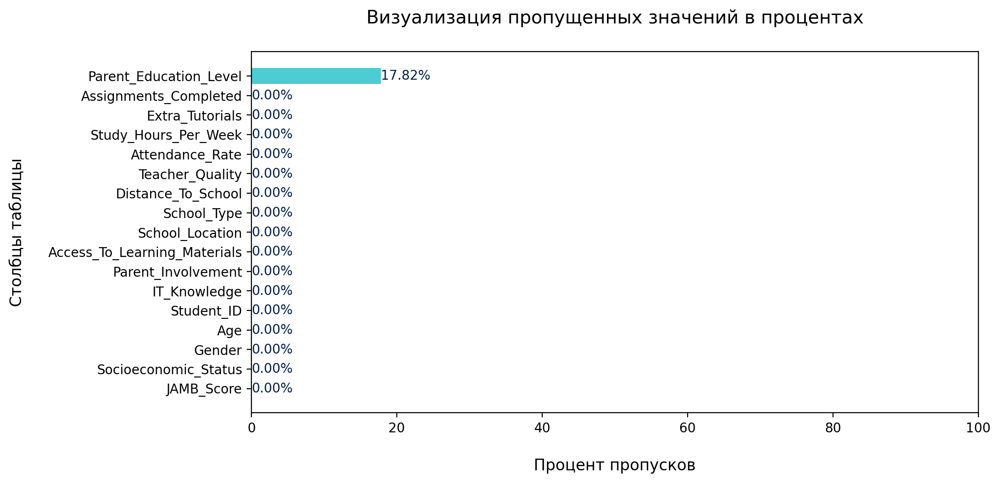

In [6]:
general_info(jamb)

📌 **Выводы по знакомству с данными**:

* Датасет включает в себя 5000 записей о студентах, сдающих JAMB. Состоит из 17 полей – характеристик для каждого студента; 
* Для удобства дальнейшего исследования названия полей лучше привести к нижнему регистру;
* Необходимости в преобразовании типов данных нет;
* Есть пропущенные значения в столбце `Parent_Education_Level` – они составляют ≈17.82% от всего датасета. 

____

📌 **Первые выводы о статистических характеристиках количественных признаков**:


`JAMB_Score`:
* Баллы за экзамен варьируется от 100 до 367 баллов (из 400 возможных);
* Средний балл равен ≈174.07, а медианный – 170. Более высокий средний балл сигнализирует о наличии выбросов; 
* Стандартное отклонение (≈47.62) говорит о том, что баллы студентов варьируются довольно сильно.


`Study_Hours_Per_Week`:
* Количество часов, которые студенты посвящают учебе в неделю, находятся в диапазоне от 0 до 40 часов;
* В среднем студенты посвящают учебе ≈19.52 часа в неделю, при этом половина всех студентов тратит на учебу не более 19 часов. Среднее значение и медиана близки друг к другу, что может указывать на то, что распределение данных относительно симметрично и не содержит значительных выбросов;
* Стандартное отклонение (≈9.63) говорит о том, что есть студенты, которые тратят значительно меньше или больше времени на учебу. 

`Attendance_Rate`:
* Процент, характеризующий количество дней, который студенты посещают школу в течение учебного года, колеблется от 50 до 100%;
* В среднем студенты посещают школу ≈84.24% от всего учебного года. Медианное значение данного признака (82%) почти не отличается от среднего, что указывает на отсутствие сильных выбросов;
* Стандартное отклонение (≈9.49) указывает на наличие студентов, которые посещают учебное заведение значительное меньше или больше.


`Teacher_Quality`:
* Качество преподавания в школе оценивается от 1 до 5, и датасет включает все возможные значения;
* В среднем качество преподавания оценивается на 2.52 балла, и половина студентов поставила оценку не более 2 баллов. Средний и медианный балл близки друг к другу, что указывает на отсутствие значительных выбросов;
* Стандартное отклонение (≈0.99) незначительно, что указывает на однородность данных по рассматриваемому признаку. 


`Distance_To_School`:
* Расстояние, которое преодолевает студент, чтобы добраться до школы, колеблется от 0 до 20 км. Однако значение "0" может быть аномальным, и его стоит рассмотреть отдельно;
* Среднее расстояние до школы равно ≈10.01 км и совпадает с медианным. Это значит, что распределение расстояний значительных выбросов не содержит;


`Age`:
* Возраст студентов варьируется от 15 до 22 лет;
* Средний возраст студентов равен ≈18.45 и он очень близок к медианному значению возраста – 18 лет; 
* Небольшое стандартное отклонение (≈2.3) говорит о том, что данные достаточно однородны. 

## Предобработка данных <a class="anchor" id="second-bullet"></a>

### Переименование столбцов

Для удобства дальнейшего анализа приведем к нижнему регистру названия всех полей:

In [7]:
# приведение названия полей к нижнему регистру

jamb.columns = jamb.columns.str.lower()

In [8]:
# check

jamb.columns

Index(['jamb_score', 'study_hours_per_week', 'attendance_rate',
       'teacher_quality', 'distance_to_school', 'school_type',
       'school_location', 'extra_tutorials', 'access_to_learning_materials',
       'parent_involvement', 'it_knowledge', 'student_id', 'age', 'gender',
       'socioeconomic_status', 'parent_education_level',
       'assignments_completed'],
      dtype='object')

### Изменение типа данных

Для дальнейшего исследования создадим копию датасета, в которой преобразуем категориальные ранговые переменные `parent_involvment`, `it_knowlegde`, `socioeconomic_status` в числовые: 

In [9]:
jamb_2 = jamb.copy()

jamb_2['parent_involvement'] = jamb_2['parent_involvement'].replace({'Low': 0, 'Medium': 1, 'High': 2})
jamb_2['it_knowledge'] = jamb_2['it_knowledge'].replace({'Low': 0, 'Medium': 1, 'High': 2})
jamb_2['socioeconomic_status'] = jamb_2['socioeconomic_status'].replace({'Low': 0, 'Medium': 1, 'High': 2})
jamb_2['extra_tutorials'] = jamb_2['extra_tutorials'].replace({'No': 0, 'Yes': 1})
jamb_2['access_to_learning_materials'] = jamb_2['access_to_learning_materials'].replace({'No': 0, 'Yes': 1})

In [10]:
# check

jamb_2.head()

,jamb_score,study_hours_per_week,attendance_rate,teacher_quality,distance_to_school,school_type,school_location,extra_tutorials,access_to_learning_materials,parent_involvement,it_knowledge,student_id,age,gender,socioeconomic_status,parent_education_level,assignments_completed
0,192,22,78,4,12.4,Public,Urban,1,1,2,1,1,17,Male,0,Tertiary,2
1,207,14,88,4,2.7,Public,Rural,0,1,2,2,2,15,Male,2,NaN,1
2,182,29,87,2,9.6,Public,Rural,1,1,2,1,3,20,Female,2,Tertiary,2
3,210,29,99,2,2.6,Public,Urban,0,1,1,2,4,22,Female,1,Tertiary,1
4,199,12,98,3,8.8,Public,Urban,0,1,1,1,5,22,Female,1,Tertiary,1


### Обработка пропущенных значений <a class="anchor" id="nan-bullet"></a>

Пропущенные значения содержатся только в одном столбце `parent_education_level`, характеризующим уровень образования родителей. 

Они могут означать как отсутствие образования, так и отсутствие информации об образовании (например, родители погибли, и студент не может получить ответа на этот вопрос). 

Есть несколько стратегий их обработки:
1) заполнить пропуски значением `unknown`/`no data`;
2) заполнить наиболее частым значением по логичным связанным признакам (например, по признакам `it_knowledge`, `socioeconomic_status`);
Все варианты заполнения можно найти в [приложении](#last-bullet). 

Было принято решение заполнить пропуски значением `unknown`, которое подтвердилось интересными результатами корреляционного анализа:

In [11]:
# замена пропущенного значения

jamb['parent_education_level'] = jamb['parent_education_level'].fillna('Unknown')
jamb_2['parent_education_level'] = jamb_2['parent_education_level'].fillna('Unknown')

In [2]:
jamb=pd.get_dummies(jamb, drop_first=True)

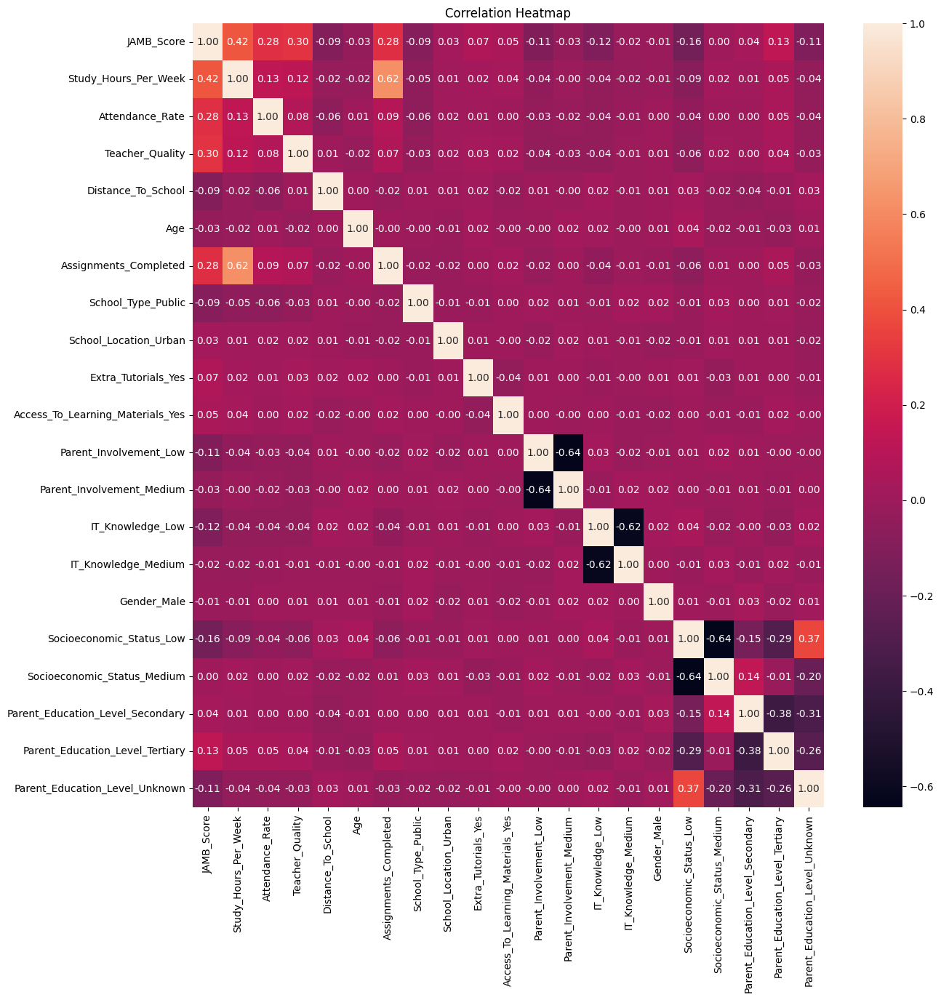

In [3]:
plt.figure(figsize=(14, 14))
sns.heatmap(jamb.corr(), annot=True, fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
jamb = jamb_2.copy()
jamb=pd.get_dummies(jamb, drop_first=True)

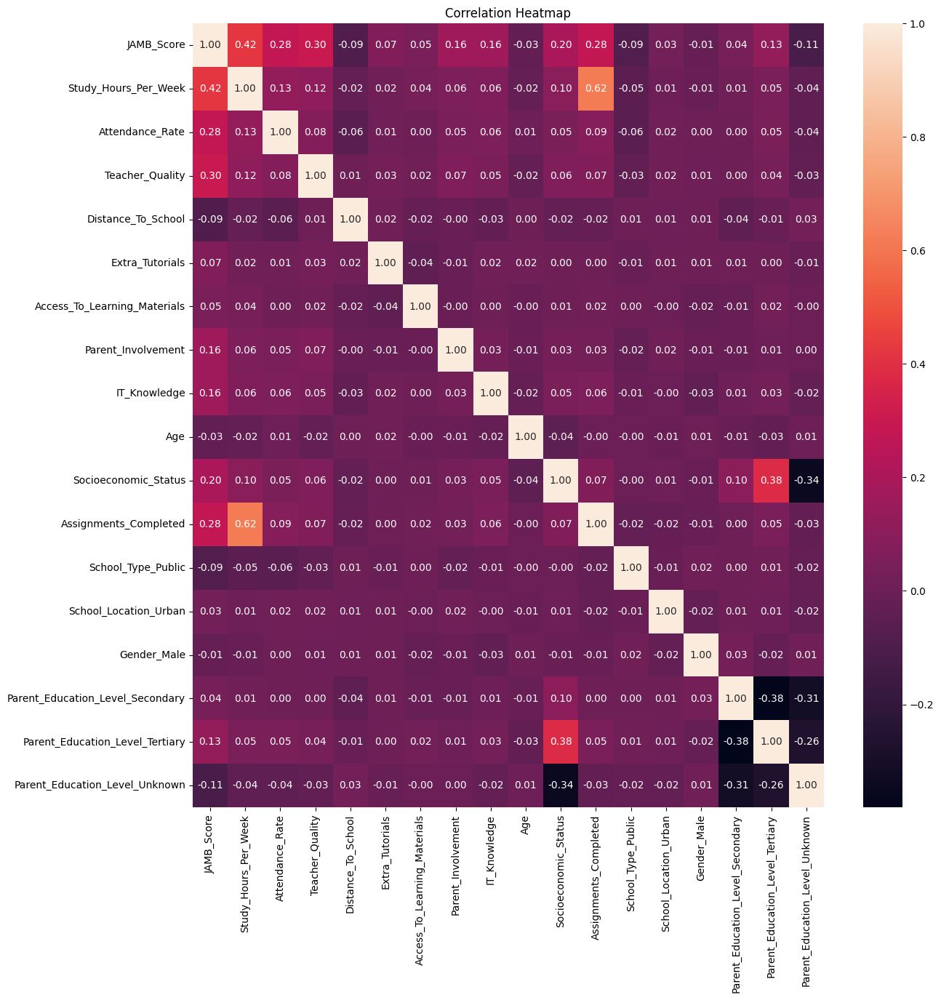

In [7]:
plt.figure(figsize=(14, 14))
sns.heatmap(jamb.corr(), annot=True, fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

Видим, что уровень образования коррелирует с социально-экономическим статусом: 
* У студентов, чьи родители имеют высшее образование, социально-экономический статус более высокий;
* У записей, в которых отсутствует информация об образовании, наблюдается отрицательная корреляция с социально-экономическим статусом. 

Это подтверждает идею о том, что заменять данные значения целесообразно только "Unknown". 

In [12]:
# перевод категориальных переменных в числовые

jamb_2['parent_education_level'] = jamb_2['parent_education_level'].replace({'Unknown': 0, 'Primary': 1,\
                                                                         'Secondary': 2, 'Tertiary': 3})

### Обработка дубликатов

Проверим датасет на наличие явных дубликатов

In [13]:
# поиск явных дубликатов

jamb.duplicated().sum()

0

Дубликаты отсутствуют. 

Проверим датасет на наличие неявных дубликатов по значению в столбце `student_id`:

In [14]:
# поиск неявных дубликатов по столбцу `student_id`

jamb.duplicated(subset=['student_id']).sum()

0

Неявные дубликаты отсутствуют. 

В таком случае можно удалить данный столбец, так как он точно не влияет на успеваемость: 

In [15]:
jamb = jamb.drop('student_id', axis=1)
jamb_2 = jamb_2.drop('student_id', axis=1)

📌 **Результаты предобработки:**
* Названия стобцов были приведены к нижнему регистру для удобства дальнейшего исследования;
* В столбце `parent_education_level` пропущенные значения были изменены на значение *"Unknown"*;
* Была создания копия датасета, в котором категориальные ранговые переменные `parent_education_level`, `it_knowledge`, `socioeconomic_status` и категориальные бинарные переменные `extra_tutorials`, `access_to_learning_materials` были переведены в числовые;
* В результате проверки на дубликаты дубликаты не обнаружены. 

## Исследовательский анализ данных <a class="anchor" id="third-bullet"></a>

### Исследование распределения числовых признаков <a class="anchor" id="num-bullet"></a>

Построим гистограммы распределения всех числовых признаков, представленных в датасете:

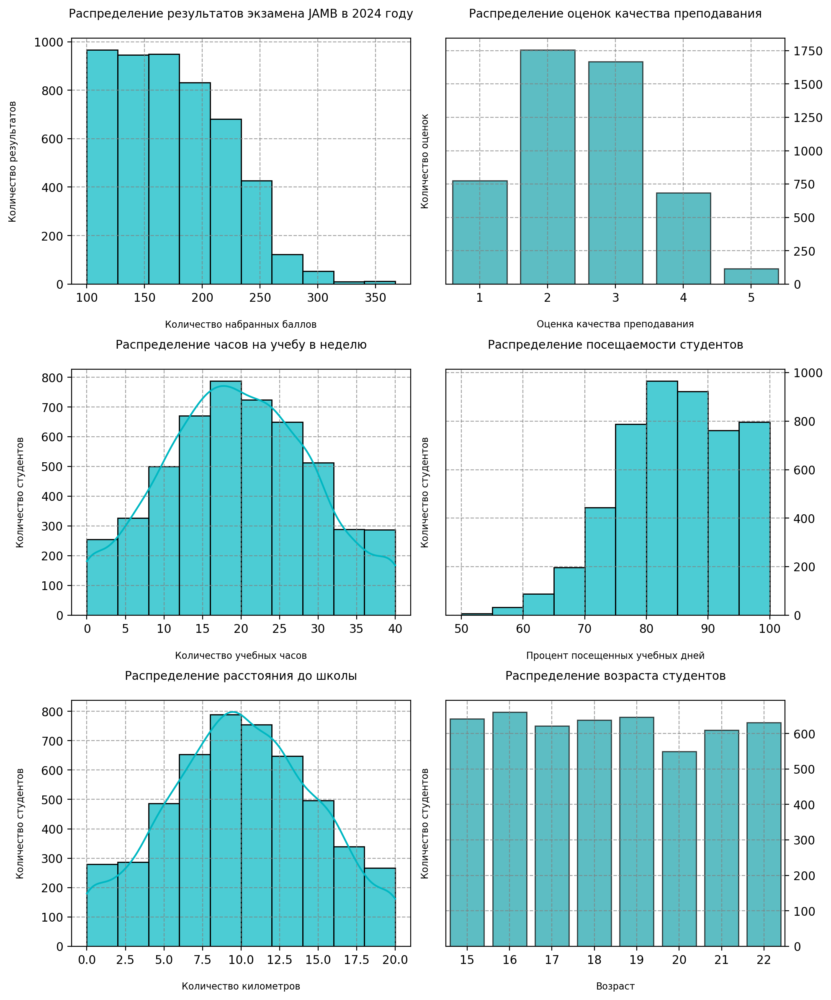

In [16]:
# построение гистограмм распределения количественных признаков

fig, axs = plt.subplots(3, 2, figsize=(10, 12))

sns.histplot(jamb['jamb_score'], bins=10, color='#00b7c2', alpha=0.7, ax=axs[0,0])
axs[0,0].set_title('Распределение результатов экзамена JAMB в 2024 году\n', fontsize=10)
axs[0,0].set_xlabel('\nКоличество набранных баллов', fontsize=8)
axs[0,0].set_ylabel('Количество результатов\n', fontsize=8)
axs[0,0].grid(linestyle='--', color='gray', alpha=0.7)

teacher_qua_counts = jamb['teacher_quality'].value_counts().reset_index()
teacher_qua_counts.columns = ['teacher_quality', 'count']
sns.barplot(data=teacher_qua_counts, x='teacher_quality', y='count', ax=axs[0,1], color='#00b7c2', edgecolor='black', alpha=0.7)
axs[0,1].set_title('Распределение оценок качества преподавания\n', fontsize=10)
axs[0,1].set_xlabel('\nОценка качества преподавания', fontsize=8)
axs[0,1].set_ylabel('Количество оценок\n', fontsize=8)
axs[0,1].grid(linestyle='--', color='gray', alpha=0.7)
axs[0,1].yaxis.tick_right()

sns.histplot(jamb['study_hours_per_week'], bins=10, color='#00b7c2', alpha=0.7, ax=axs[1,0], kde=True)
axs[1,0].set_title('Распределение часов на учебу в неделю\n', fontsize=10)
axs[1,0].set_xlabel('\nКоличество учебных часов', fontsize=8)
axs[1,0].set_ylabel('Количество студентов\n', fontsize=8)
axs[1,0].grid(linestyle='--', color='gray', alpha=0.7)

sns.histplot(jamb['attendance_rate'], bins=10, color='#00b7c2', alpha=0.7, ax=axs[1,1])
axs[1,1].set_title('Распределение посещаемости студентов\n', fontsize=10)
axs[1,1].set_xlabel('\nПроцент посещенных учебных дней', fontsize=8)
axs[1,1].set_ylabel('Количество студентов\n', fontsize=8)
axs[1,1].grid(linestyle='--', color='gray', alpha=0.7)
axs[1,1].yaxis.tick_right()

sns.histplot(jamb['distance_to_school'], bins=10, color='#00b7c2', alpha=0.7, ax=axs[2,0], kde=True)
axs[2,0].set_title('Распределение расстояния до школы\n', fontsize=10)
axs[2,0].set_xlabel('\nКоличество километров', fontsize=8)
axs[2,0].set_ylabel('Количество студентов\n', fontsize=8)
axs[2,0].grid(linestyle='--', color='gray', alpha=0.7)

age_counts = jamb['age'].value_counts().reset_index()
age_counts.columns = ['age', 'count']
sns.barplot(data=age_counts, x='age', y='count', ax=axs[2,1], color='#00b7c2', edgecolor='black', alpha=0.7)
axs[2,1].set_title('Распределение возраста студентов\n', fontsize=10)
axs[2,1].set_xlabel('\nВозраст', fontsize=8)
axs[2,1].set_ylabel('Количество студентов\n', fontsize=8)
axs[2,1].grid(linestyle='--', color='gray', alpha=0.7)
axs[2,1].yaxis.tick_right()

plt.tight_layout()
plt.show()

📌 **Выводы:**
* **Результаты экзамена 2024**: наибольшее количество студентов, сдавших экзамен, набрали от 100 до 200 баллов. Эти результаты близки к минимальным проходным баллам для поступления: 140 баллов для университетов, 100 баллов для педагогических колледжей, а также 100 баллов для политехнических и монотехнических вузов, а также институтов инновационного предпринимательства (Источник: [JAMB](https://www.jamb.gov.ng/));
* **Удовлетворенность качеством образования:** значительное число студентов выражает недовольство качеством образования: более 3000 студентов оценили его на 2-3 балла. Более 750 студентов поставили наименьшую оценку (1), что указывает на их абсолютное недовольство. Около половины студентов оценили качество преподавания на 1-2 балла, а более 80% студентов оценили его на 1-3 балла;
* **Распределение учебных часов:** гистограмма распределения учебных часов в неделю имеет нормальное распределение. Большинство студентов уделяют учебе от 10 до 30 часов в неделю;
* **Посещаемость школы:** среди студентов нет тех, кто посещал школу менее 50% учебных дней в году. Большинство студентов посещают школу не менее 80% учебных дней;
* **Расстояние до школы:** гистограмма расстояния до школы также имеет нормальное распределение. Для большинства студентов расстояние до школы составляет от 5 до 15 км. Следует отметить, что в данных присутствуют значения, равные 0, и мы рассмотрим их подробнее при анализе боксплотов;
* **Возраст студентов:** возраст студентов распределен равномерно в диапазоне от 15 до 22 лет. Наименьшее количество студентов, сдающих экзамен JAMB, составляет 20 лет.

Построим боксплоты для признаков `jamb_score`, `study_hours_per_week`, `attendance_rate`, `distance_to_school`

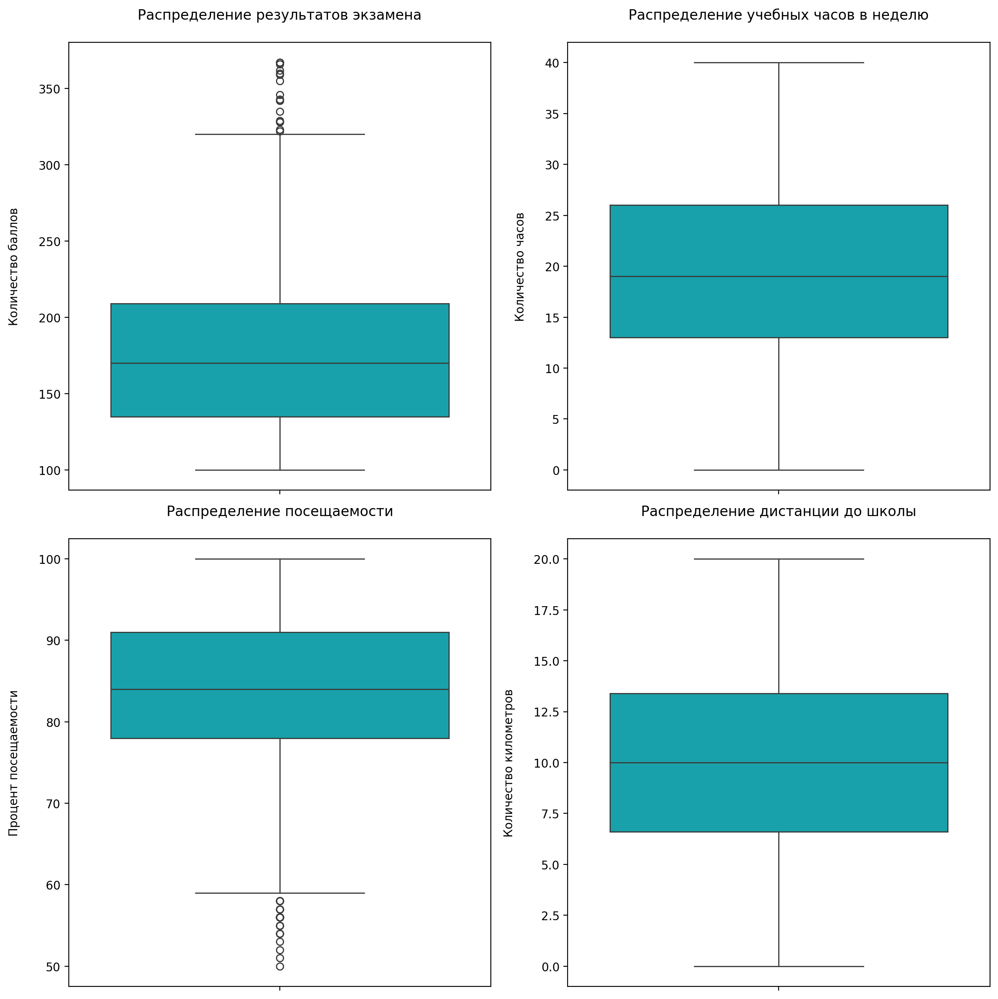

In [17]:
# построение боксплотов распределения

fig, axs = plt.subplots(2, 2, figsize=(12, 12))

sns.boxplot(jamb['jamb_score'], ax=axs[0,0], color='#00b7c2')
axs[0,0].set_title('Распределение результатов экзамена\n')
axs[0,0].set_ylabel('Количество баллов\n')

sns.boxplot(jamb['study_hours_per_week'], ax=axs[0,1], color='#00b7c2')
axs[0,1].set_title('Распределение учебных часов в неделю\n')
axs[0,1].set_ylabel('Количество часов\n')

sns.boxplot(jamb['attendance_rate'], ax=axs[1,0], color='#00b7c2')
axs[1,0].set_title('Распределение посещаемости\n')
axs[1,0].set_ylabel('Процент посещаемости\n')

sns.boxplot(jamb['distance_to_school'], ax=axs[1,1], color='#00b7c2')
axs[1,1].set_title('Распределение дистанции до школы\n')
axs[1,1].set_ylabel('Количество километров\n')

plt.tight_layout()
plt.show()

Все боксплоты можно найти в [приложении](#last-bullet)

📌 **Выводы:**
* **Распределение результатов экзамена:** на боксплоте распределения результатов экзамена мы наблюдаем аномальные значения, которые превышают 320 баллов. Всего таких результатов зафиксировано 18, что составляет примерно 0.36% от общего объема данных.

* **Распределение расстояния до школы:** боксплот распределения расстояния до школы не показывает наличия выбросов, хотя в данных присутствуют нулевые значения, равные 0.0 км.

* **Распределение учебных часов в неделю:** аналогично, боксплот распределения учебных часов в неделю также не выявляет выбросов.

* **Распределение процента посещаемости:** на боксплоте распределения процента посещаемости школы в течение года выбросами считаются значения ниже 58.5%. Всего таких значений зафиксировано 29, что составляет примерно 0.58% от общего объема данных.

Построим сварм-плоты для признаков `jamb_score`, `study_hours_per_week`, `attendance_rate`, `distance_to_school`

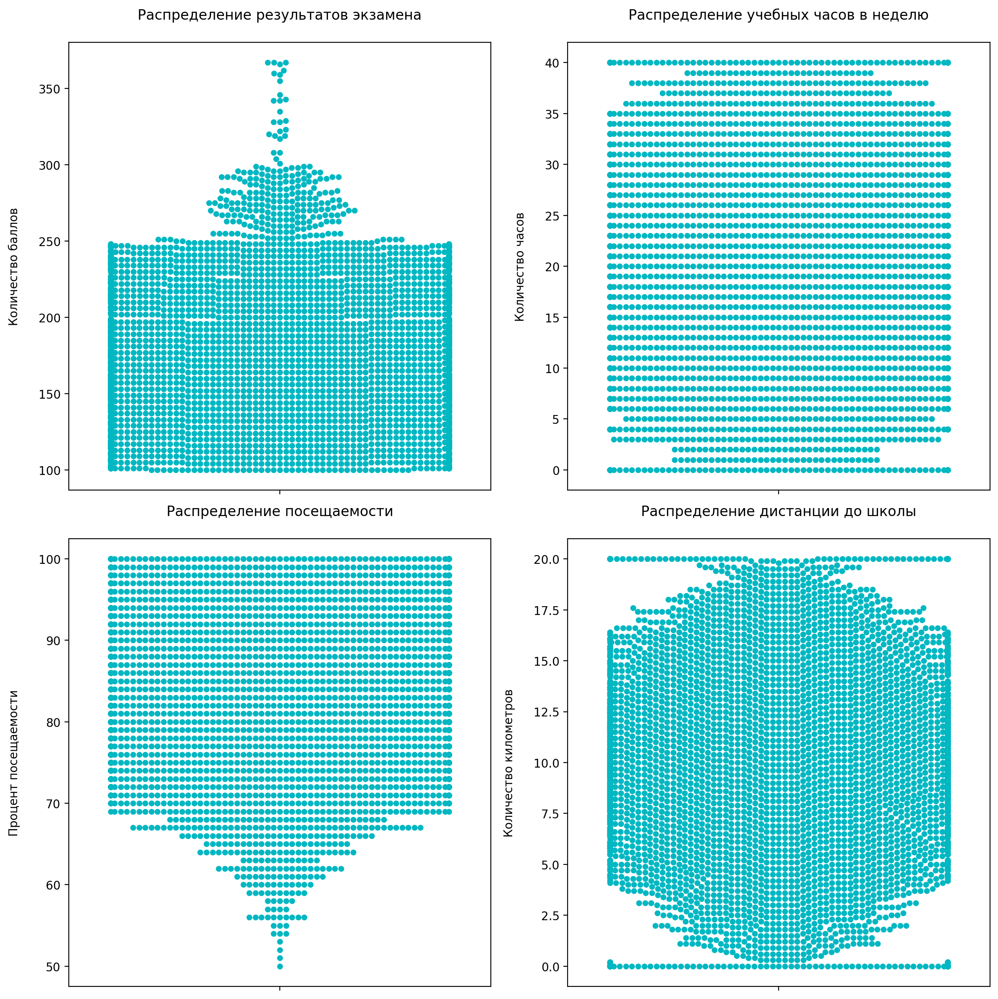

In [18]:
# построение сварм-плотов распределения

fig, axs = plt.subplots(2, 2, figsize=(12, 12))

sns.swarmplot(jamb['jamb_score'], ax=axs[0,0], color='#00b7c2')
axs[0,0].set_title('Распределение результатов экзамена\n')
axs[0,0].set_ylabel('Количество баллов\n')

sns.swarmplot(jamb['study_hours_per_week'], ax=axs[0,1], color='#00b7c2')
axs[0,1].set_title('Распределение учебных часов в неделю\n')
axs[0,1].set_ylabel('Количество часов\n')

sns.swarmplot(jamb['attendance_rate'], ax=axs[1,0], color='#00b7c2')
axs[1,0].set_title('Распределение посещаемости\n')
axs[1,0].set_ylabel('Процент посещаемости\n')

sns.swarmplot(jamb['distance_to_school'], ax=axs[1,1], color='#00b7c2')
axs[1,1].set_title('Распределение дистанции до школы\n')
axs[1,1].set_ylabel('Количество километров\n')

plt.tight_layout()
plt.show()

Все свармплоты можно найти в [приложении](#last-bullet)

📌 **Выводы:**
* **Распределение расстояния до школы:** на свармплоте мы наблюдаем примерно одинаковое количество значений "0.0" и "20.0". Это позволяет предположить, что значение "0.0" может указывать на дистанцию до школы менее 1 км, в то время как значение "20.0" соответствует дистанции не менее 20 км;

* **Распределение учебных часов в неделю:** аналогичная тенденция наблюдается и на свармплоте распределения учебных часов в неделю. Можно предположить, что значение "0" обозначает, что студент уделяет менее 1 часа в неделю на учебу, а значение "40" указывает на то, что студент занимается не менее 40 часов в неделю.

### Исследование взаимосвязей между числовыми признаками <a class="anchor" id="num2-bullet"></a>

Построим диаграммы рассеяния для анализа взаимосвязей между:
* Результатом экзамена и количеством часов, уделяемых учебе в неделю;
* Результатом экзамена и процентом посещаемости школы за год;
* Результатом экзамена и расстоянием до школы;
* Количеством часов, уделяемых учебе, и процент посещаемости. 

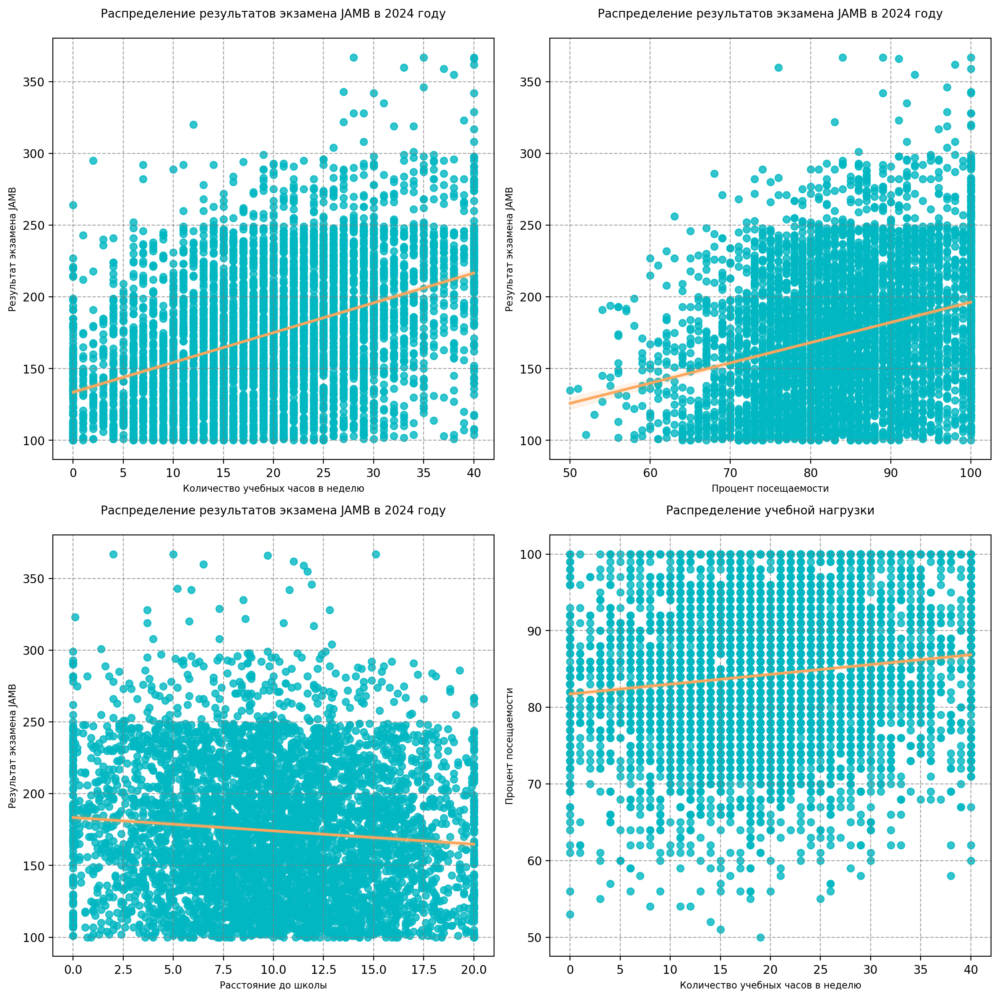

In [19]:
# построение диаграмм рассеяния для числовых признаков

fig, axs = plt.subplots(2, 2, figsize=(12, 12))

sns.regplot(data=jamb, x='study_hours_per_week', y='jamb_score', ax=axs[0,0], color='#00b7c2',\
            line_kws={'color': '#FCA65D'})
axs[0,0].set_title('Распределение результатов экзамена JAMB в 2024 году\n', fontsize=10)
axs[0,0].set_xlabel('Количество учебных часов в неделю', fontsize=8)
axs[0,0].set_ylabel('Результат экзамена JAMB', fontsize=8)
axs[0,0].grid(linestyle='--', color='gray', alpha=0.7)

sns.regplot(data=jamb, x='attendance_rate', y='jamb_score', ax=axs[0,1], color='#00b7c2',\
            line_kws={'color': '#FCA65D'})
axs[0,1].set_title('Распределение результатов экзамена JAMB в 2024 году\n', fontsize=10)
axs[0,1].set_xlabel('Процент посещаемости', fontsize=8)
axs[0,1].set_ylabel('Результат экзамена JAMB', fontsize=8)
axs[0,1].grid(linestyle='--', color='gray', alpha=0.7)

sns.regplot(data=jamb, x='distance_to_school', y='jamb_score', ax=axs[1,0], color='#00b7c2',\
            line_kws={'color': '#FCA65D'})
axs[1,0].set_title('Распределение результатов экзамена JAMB в 2024 году\n', fontsize=10)
axs[1,0].set_xlabel('Расстояние до школы', fontsize=8)
axs[1,0].set_ylabel('Результат экзамена JAMB', fontsize=8)
axs[1,0].grid(linestyle='--', color='gray', alpha=0.7)

sns.regplot(data=jamb, x='study_hours_per_week', y='attendance_rate', ax=axs[1,1], color='#00b7c2',\
            line_kws={'color': '#FCA65D'})
axs[1,1].set_title('Распределение учебной нагрузки\n', fontsize=10)
axs[1,1].set_xlabel('Количество учебных часов в неделю', fontsize=8)
axs[1,1].set_ylabel('Процент посещаемости', fontsize=8)
axs[1,1].grid(linestyle='--', color='gray', alpha=0.7)

plt.tight_layout()
plt.show()

Дополнительные пэир-плоты можно найти в [приложении](#last-bullet)

📌 **Выводы:**
* **Взаимосвязь между результатами экзамена и учебными часами:** на диаграмме рассеяния, отображающей результаты экзамена в зависимости от количества учебных часов в неделю, наблюдается положительная взаимосвязь. Это означает, что студенты, которые уделяют больше времени учебе, как правило, получают более высокие результаты на экзаменах;
* **Взаимосвязь между результатами экзамена и посещаемостью:** аналогично, на диаграмме рассеяния результатов экзамена в зависимости от процента посещаемости школы также наблюдается положительная корреляция. Студенты, которые чаще посещают школу, в среднем набирают больше баллов на экзаменах;
* **Влияние расстояния до школы на результаты экзамена:** на диаграмме рассеяния результатов экзамена в зависимости от расстояния до школы отмечается незначительная отрицательная связь. Это указывает на то, что чем дальше студент живет от школы, тем ниже его результаты на экзаменах;
* **Корреляция между учебными часами и посещаемостью:** также можно отметить положительную корреляцию между количеством учебных часов в неделю и процентом посещаемости. Это говорит о том, что студенты, которые больше учатся, как правило, также чаще посещают занятия.

### Исследование категориальных признаков <a class="anchor" id="cat-bullet"></a>

Для анализа распределения данных по признакам `gender`, `school_type` и `school_location` построим круговые диаграммы: 

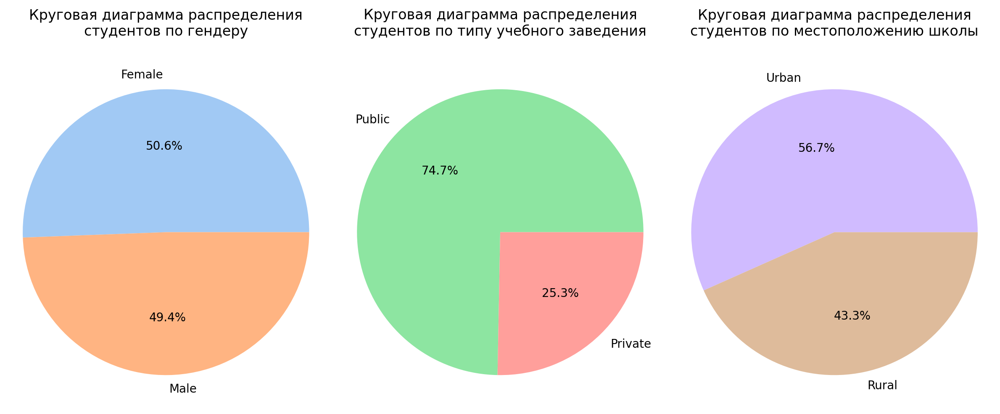

In [20]:
# построение круговых диаграмм распределения категориальных признаков

fig, axs = plt.subplots(1, 3, figsize=(12, 5))

gender_counts = jamb['gender'].value_counts()
axs[0].pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', colors = sns.color_palette('pastel'))
axs[0].axis('equal')
axs[0].set_title('Круговая диаграмма распределения\nстудентов по гендеру\n')

school_type_counts = jamb['school_type'].value_counts()
axs[1].pie(school_type_counts, labels=school_type_counts.index, autopct='%1.1f%%', colors = sns.color_palette('pastel')[2:4])
axs[1].axis('equal')
axs[1].set_title('Круговая диаграмма распределения\nстудентов по типу учебного заведения\n')

school_loc_counts = jamb['school_location'].value_counts()
axs[2].pie(school_loc_counts, labels=school_loc_counts.index, autopct='%1.1f%%', colors = sns.color_palette('pastel')[4:6])
axs[2].axis('equal')
axs[2].set_title('Круговая диаграмма распределения\nстудентов по местоположению школы\n')

plt.tight_layout()
plt.show()

📌 **Выводы:**
* **Гендерное распределение студентов:** в представленном датасете наблюдается примерно равное количество студентов обоих гендеров, что указывает на сбалансированное представительство;
* **Тип образовательного учреждения:** около 75% студентов обучаются в общеобразовательных школах, в то время как лишь 25% являются учащимися частных школ. Это свидетельствует о преобладании общественного образования в данной выборке.
* **Распределение школ по типу населенного пункта:** в датасете зафиксировано, что чуть больше школ расположено в городах по сравнению с деревнями, хотя разница в количестве незначительна. Это может указывать на тенденцию к концентрации образовательных учреждений в более населенных и развитых районах.

Для анализа распределения данных по признакам `socioeconomic_status`, `parent_involvement` и `parent_education_level` построим столбчатые диаграммы: 

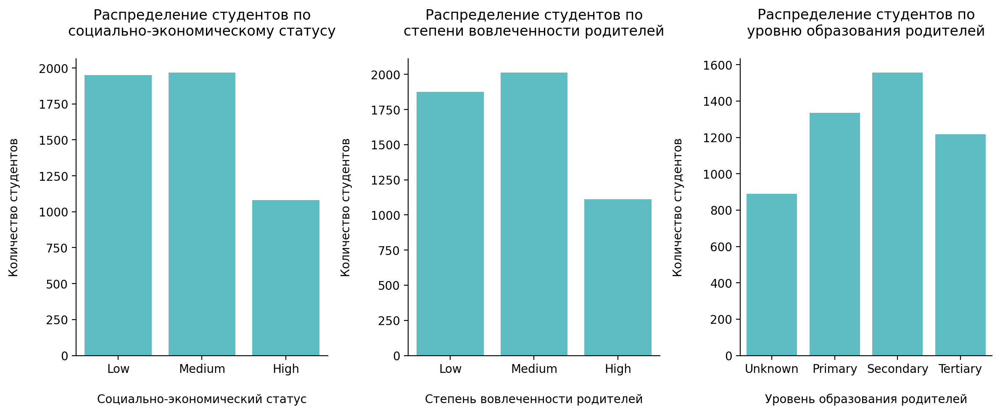

In [21]:
# построение столбчатых диаграмм распределения категориальных признаков

fig, axs = plt.subplots(1, 3, figsize=(12, 5))

soc_status_counts = jamb['socioeconomic_status'].value_counts().reset_index()
soc_status_counts.columns = ['socioeconomic_status', 'count']
sns.barplot(data=soc_status_counts, x='socioeconomic_status', y='count', ax=axs[0], color='#00b7c2',\
            alpha=0.7, order=['Low', 'Medium', 'High'])
axs[0].set_title('Распределение студентов по\nсоциально-экономическому статусу\n')
axs[0].set_xlabel('\nСоциально-экономический статус')
axs[0].set_ylabel('Количество студентов\n')
axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)

parent_involve_counts = jamb['parent_involvement'].value_counts().reset_index()
parent_involve_counts.columns = ['parent_involvement', 'count']
sns.barplot(data=parent_involve_counts, x='parent_involvement', y='count', ax=axs[1], color='#00b7c2', \
            alpha=0.7, order=['Low', 'Medium', 'High'])
axs[1].set_title('Распределение студентов по\nстепени вовлеченности родителей\n')
axs[1].set_xlabel('\nСтепень вовлеченности родителей')
axs[1].set_ylabel('Количество студентов\n')
axs[1].spines['top'].set_visible(False)
axs[1].spines['right'].set_visible(False)

parent_ed_counts = jamb['parent_education_level'].value_counts().reset_index()
parent_ed_counts.columns = ['parent_education_level', 'count']
sns.barplot(data=parent_ed_counts, x='parent_education_level', y='count', ax=axs[2], color='#00b7c2', \
            alpha=0.7, order=['Unknown', 'Primary', 'Secondary', 'Tertiary'])
axs[2].set_title('Распределение студентов по\nуровню образования родителей\n')
axs[2].set_xlabel('\nУровень образования родителей')
axs[2].set_ylabel('Количество студентов\n')
axs[2].spines['top'].set_visible(False)
axs[2].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

📌 **Выводы:**
* **Социально-экономический статус семей:** более 3500 студентов, что составляет свыше 70% от общего объема данных, происходят из семей со средним или низким социально-экономическим статусом;
* **Степень вовлеченности родителей:** большинство студентов оценивают степень вовлеченности своих родителей как среднюю;
* **Уровень образования родителей:** большинство родителей студентов имеют среднее образование. Это может влиять на уровень поддержки, которую они могут предоставить своим детям в учебе, а также на их понимание важности высшего образования.

### Исследование влияния признаков на результат экзамена <a class="anchor" id="jamb-bullet"></a>

#### Вовлеченность родителей и результат экзамена

Построим боксплот, чтобы посмотреть на распределение результатов за экзамен в зависимости от вовлеченности родителей:

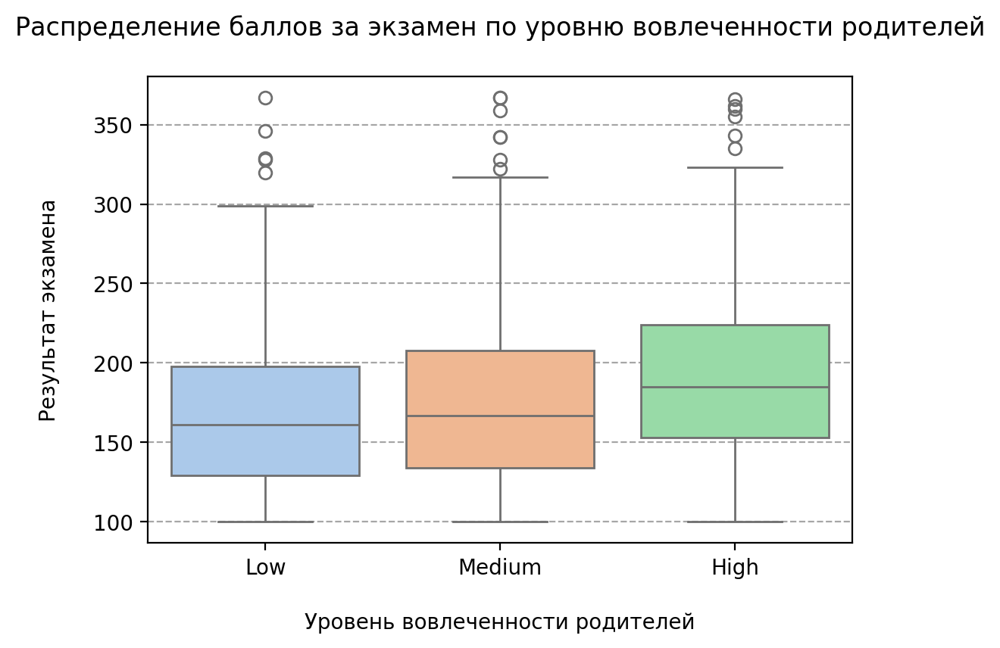

In [22]:
# боксплот результатов за экзамен в зависимости от степени вовлеченности родителей

plt.figure(figsize=(6, 4))
sns.boxplot(data=jamb, x='parent_involvement', y='jamb_score', palette='pastel',\
           order=['Low', 'Medium', 'High'])
plt.title('Распределение баллов за экзамен по уровню вовлеченности родителей\n')
plt.xlabel('\nУровень вовлеченности родителей')
plt.ylabel('Результат экзамена\n')
plt.grid(axis='y', linestyle='--', color='gray', alpha=0.7)

plt.show()

📌 **Выводы:**
* Наиболее высокий медианный балл демонстрируют студенты с высокой вовлеченностью родителей в учебный процесс. Средняя половина результатов таких студентов находится в диапазоне от 150 до ≈230 баллов;
* Медианный балл у студентов со средней родительской вовлеченностью и низкой примерно одинаковый: ≈170 баллов. Средняя половина баллов у студентов со средней родительской вовлеченностью находится в диапазоне от ≈140 до ≈210 баллов, а у студентов с низкой вовлеченностью родителей – от ≈130 до ≈200 баллов.
* Несмотря на степень вовлеченности родителей, во всех категориях есть одаренные студенты с аномально высокими результатами для данного датасета. 

#### Социально-экономическое положение семьи студента и результат экзамена

Построим боксплот, чтобы посмотреть на распределение результатов за экзамен в зависимости от социально-экономического положения семьи студента:

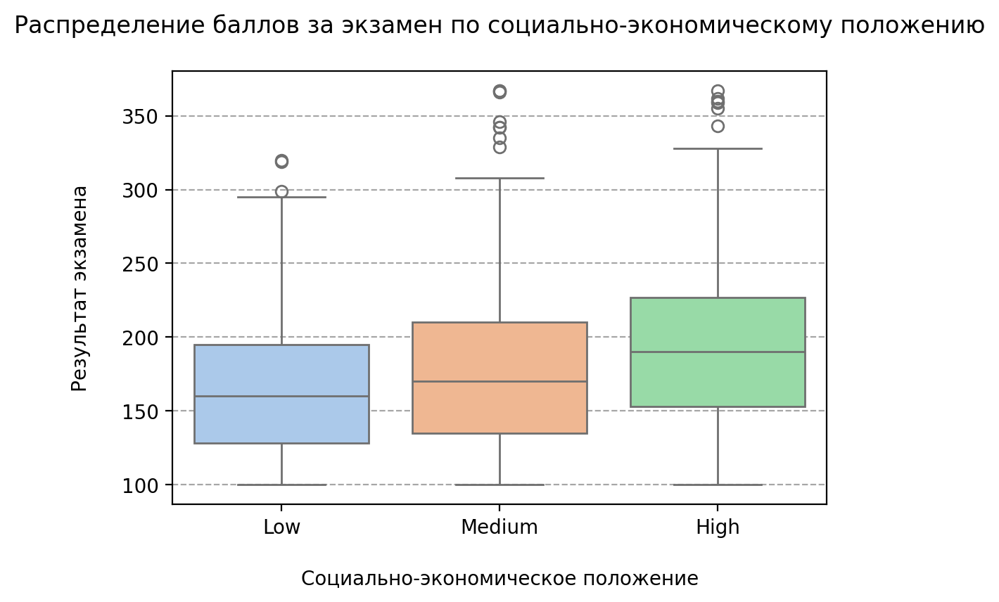

In [23]:
# боксплот результатов за экзамен в зависимости от социально-экономического положения

plt.figure(figsize=(6, 4))
sns.boxplot(data=jamb, x='socioeconomic_status', y='jamb_score', palette='pastel',\
           order=['Low', 'Medium', 'High'])
plt.title('Распределение баллов за экзамен по социально-экономическому положению\n')
plt.xlabel('\nСоциально-экономическое положение')
plt.ylabel('Результат экзамена\n')
plt.grid(axis='y', linestyle='--', color='gray', alpha=0.7)

plt.show()

📌 **Выводы:**
* Наиболее высокий медианный балл демонстрируют студенты с высоким социально-экономическим положением – ≈180.  Средняя половина результатов таких студентов находится в диапазоне от 150 до ≈230 баллов;
* Медианный балл у студентов со средним соц-экономическим положением составляет ≈170 баллов. Средняя половина баллов у студентов находится в диапазоне от ≈140 до ≈210 баллов;
* Для студентов с низким соц-экономическим положением медианный результат составляет ≈160 баллов. Средняя половина баллов у таких студентов находится в диапазоне от ≈135 до ≈190 баллов;
* Можно заключить, что чем лучше социально-экономическое положение семьи, тем лучше студент справляется со вступительными экзаменами. 

#### Уровень образования родителей и результат экзамена

Построим боксплот, чтобы посмотреть на распределение результатов за экзамен в зависимости от уровня образования родителей:

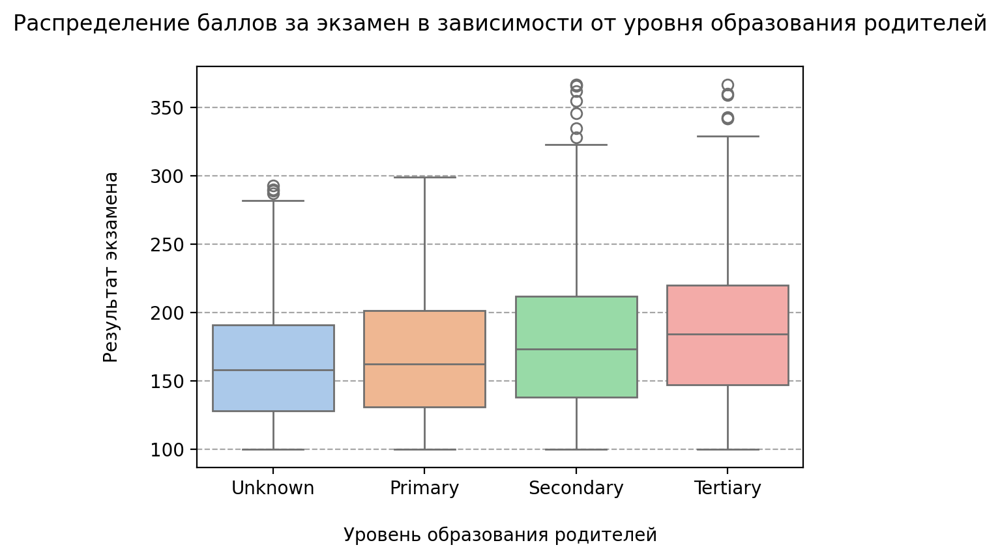

In [24]:
# боксплот результатов за экзамен в зависимости от уровня образования родителей

plt.figure(figsize=(6, 4))
sns.boxplot(data=jamb, x='parent_education_level', y='jamb_score', palette='pastel',\
           order=['Unknown', 'Primary', 'Secondary', 'Tertiary']) 
plt.title('Распределение баллов за экзамен в зависимости от уровня образования родителей\n')
plt.xlabel('\nУровень образования родителей')
plt.ylabel('Результат экзамена\n')
plt.grid(axis='y', linestyle='--', color='gray', alpha=0.7)

plt.show()

📌 **Выводы:**
* Наиболее высокий медианный балл демонстрируют студенты, чьи родители имеют высшее образование – ≈170 баллов. Средняя половина результатов таких студентов находится в диапазоне от 150 до ≈230 баллов;
* Медианный балл у студентов, чьи родители имеют среднее образование, составляет ≈175 баллов. Средняя половина результатов таких студентов находится в диапазоне от ≈140 до ≈220 баллов;
* Для студентов, чьи родители имеют начальное образование, медианный балл составляет ≈165 баллов. Средняя половина результатов находится в диапазоне от ≈130 до ≈200 баллов. Отметим также, что среди студентов этой категории нет аномально высоких результатов. 

### Матрица корреляций между числовыми характеристиками <a class="anchor" id="corr-bullet"></a>

Нормализуем данные:

In [25]:
from sklearn.preprocessing import MinMaxScaler 

number_columns = jamb_2.select_dtypes(include=['number']).columns

scaler = MinMaxScaler()
jamb_2[number_columns] = pd.DataFrame(scaler.fit_transform(jamb_2[number_columns]), columns=number_columns)
jamb_2.head()

,jamb_score,study_hours_per_week,attendance_rate,teacher_quality,distance_to_school,school_type,school_location,extra_tutorials,access_to_learning_materials,parent_involvement,it_knowledge,age,gender,socioeconomic_status,parent_education_level,assignments_completed
0,0.344569,0.550,0.56,0.75,0.620,Public,Urban,1.0,1.0,1.0,0.5,0.285714,Male,0.0,1.0,0.25
1,0.400749,0.350,0.76,0.75,0.135,Public,Rural,0.0,1.0,1.0,1.0,0.000000,Male,1.0,0.0,0.00
2,0.307116,0.725,0.74,0.25,0.480,Public,Rural,1.0,1.0,1.0,0.5,0.714286,Female,1.0,1.0,0.25
3,0.411985,0.725,0.98,0.25,0.130,Public,Urban,0.0,1.0,0.5,1.0,1.000000,Female,0.5,1.0,0.00
4,0.370787,0.300,0.96,0.50,0.440,Public,Urban,0.0,1.0,0.5,0.5,1.000000,Female,0.5,1.0,0.00


Преобразуем категориальные переменные столбцов `school_type`, `school_location` в числовые:

In [26]:
jamb_2 = pd.get_dummies(jamb_2, drop_first=True)
jamb_2.head()

,jamb_score,study_hours_per_week,attendance_rate,teacher_quality,distance_to_school,extra_tutorials,access_to_learning_materials,parent_involvement,it_knowledge,age,socioeconomic_status,parent_education_level,assignments_completed,school_type_Public,school_location_Urban,gender_Male
0,0.344569,0.550,0.56,0.75,0.620,1.0,1.0,1.0,0.5,0.285714,0.0,1.0,0.25,True,True,True
1,0.400749,0.350,0.76,0.75,0.135,0.0,1.0,1.0,1.0,0.000000,1.0,0.0,0.00,True,False,True
2,0.307116,0.725,0.74,0.25,0.480,1.0,1.0,1.0,0.5,0.714286,1.0,1.0,0.25,True,False,False
3,0.411985,0.725,0.98,0.25,0.130,0.0,1.0,0.5,1.0,1.000000,0.5,1.0,0.00,True,True,False
4,0.370787,0.300,0.96,0.50,0.440,0.0,1.0,0.5,0.5,1.000000,0.5,1.0,0.00,True,True,False


Построим матрицу корреляций между признаками, чтобы увидеть, какие признаки могут влиять на другие:

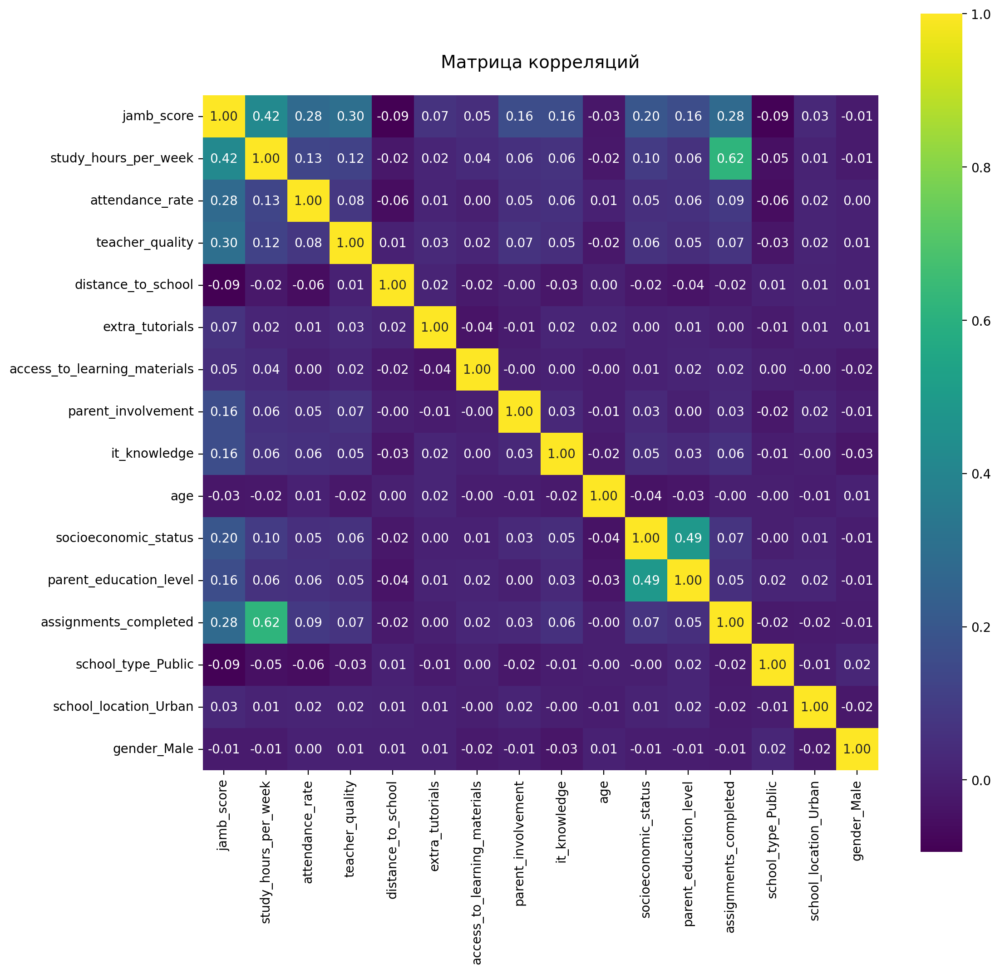

In [27]:
# построение матрицы корреляций

plt.figure(figsize=(12, 12))
sns.heatmap(jamb_2.corr(), annot=True, fmt='.2f', cmap='viridis', square=True)
plt.title('Матрица корреляций\n', fontsize=14)

plt.show()

📌 **Выводы:**
* Мы наблюдаем значительную корреляцию (0.62) между количеством учебных часов в неделю и уровнем выполненных заданий. Это позволяет предположить, что столбец `assignments_completed` отражает количество заданий, выполненных студентами в процессе обучения. Таким образом, можно сделать вывод, что чем больше времени студент уделяет учебе, тем больше заданий он успевает выполнить.
* Также мы фиксируем положительную корреляцию (0.49) между социально-экономическим статусом студента и уровнем образования его родителей. Это указывает на то, что с увеличением уровня образования родителей возрастает и социально-экономический статус их детей.
* Кроме того, корреляция между результатами экзамена и количеством часов, выделяемых на учебу в неделю, составляет 0.42. Это свидетельствует о наличии слабой положительной связи между этими двумя параметрами. 

## Приложение <a class="anchor" id="last-bullet"></a>

### Обработка пропущенных значений в `parent_educational_level`

In [28]:
def class_balance(df):
    for column in df.select_dtypes(include=['object', 'category']).columns:
        print(f"\n{column}:")
        print(df[column].value_counts(normalize=True))
        plt.figure(figsize=(12, 6))
        top = df[column].value_counts().head(5)
        top.plot.pie(autopct='%1.1f%%', fontsize=12)
        plt.title(column, fontsize=16)
        plt.legend([f'{i}: {j:.1f}%' for i, j in zip(top.index, top/top.sum()*100)], loc="upper left", bbox_to_anchor=(1, 0, 0.5, 1), fontsize=12)
        plt.show()


parent_education_level:
parent_education_level
Secondary    0.3112
Primary      0.2670
Tertiary     0.2436
Unknown      0.1782
Name: proportion, dtype: float64


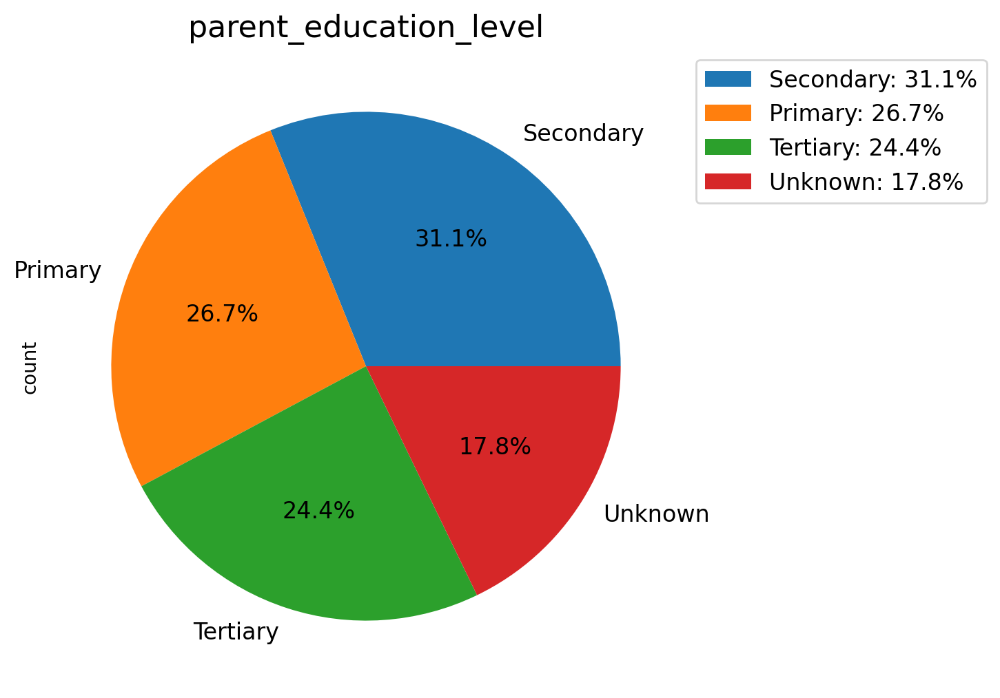

In [29]:
# заполнение наиболее частым значением, но не по всему датасету, а по логичным связанным признакам

n=jamb.parent_education_level.isnull()
jamb2=jamb.copy()
for i in (jamb2.it_knowledge.unique()):
    for j in (jamb2.socioeconomic_status.unique()):
        tf=(jamb2.it_knowledge==i)&(jamb2.socioeconomic_status==j)
        if sum(tf)>0:
            jamb2.loc[tf & n, 'parent_education_level']=jamb2.loc[tf & (~n), 'parent_education_level'].mode()[0]
class_balance(jamb2[['parent_education_level', 'age']])


parent_education_level:
parent_education_level
Secondary    0.3112
Primary      0.2670
Tertiary     0.2436
Unknown      0.1782
Name: proportion, dtype: float64


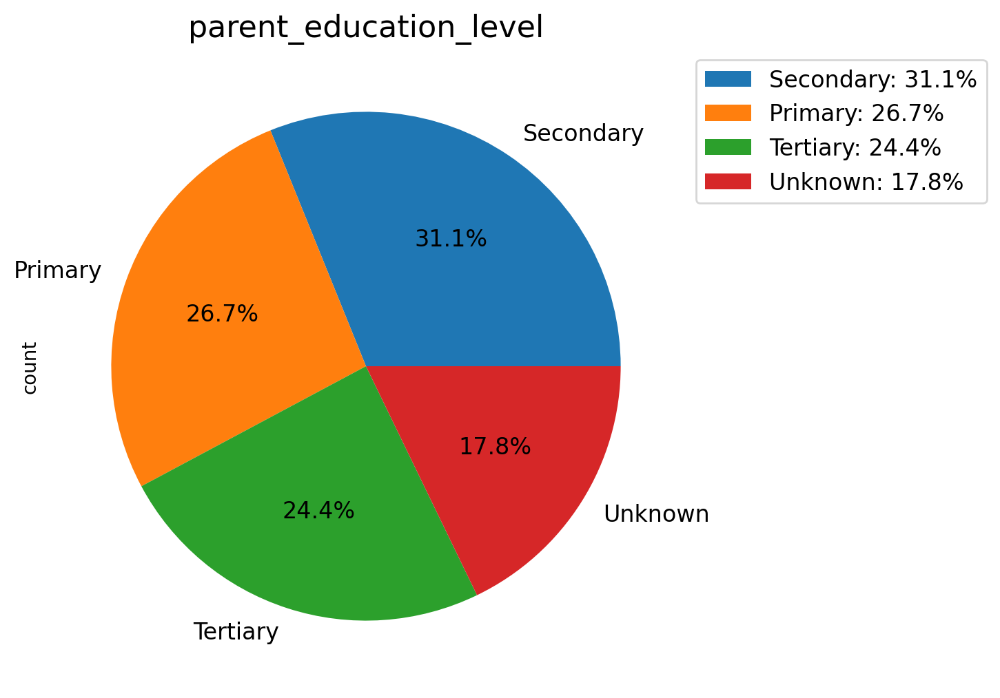

In [30]:
# заполнение наиболее частым значением, но не по всему датасету, а по логичным связанным признакам *2 
#(за счёт 2 колонок связь которых с образованием родителей спорна)
# проценты не особо значимо отличаются

n=jamb.parent_education_level.isnull()
jamb3=jamb.copy()
for i in (jamb3.it_knowledge.unique()):
    for j in (jamb3.socioeconomic_status.unique()):
        for h in (jamb3.school_type.unique()):
            for g in (jamb3.school_location.unique()):
                tf=(jamb3.it_knowledge==i)&(jamb3.socioeconomic_status==j)&(jamb3.school_type==h)&(jamb3.school_location==g)
                if sum(tf)>0:
                    jamb3.loc[tf & n, 'parent_education_level']=jamb3.loc[tf & (~n), 'parent_education_level'].mode()[0]
class_balance(jamb3[['parent_education_level', 'age']])

### Боксплоты распределения признаков

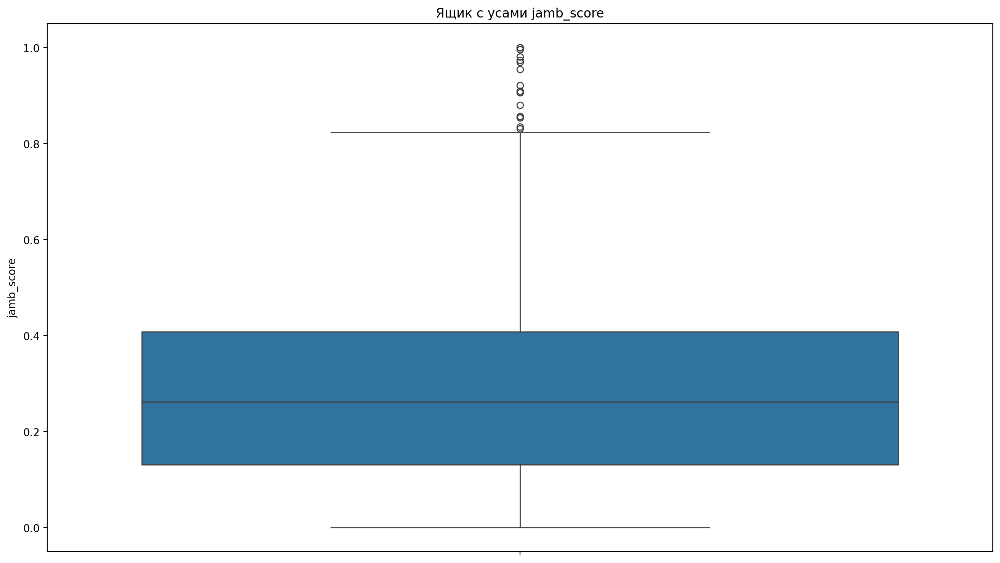

jamb_score
min 0.0 - max 1.0
lower_bound: -0.28464419475655434 - 0 штук или 0.0%
upper_bound: 0.8239700374531835 - 18 штук или 0.36%
all_bound: -0.28464419475655434 - 0.8239700374531835. 18 штук или 0.36%


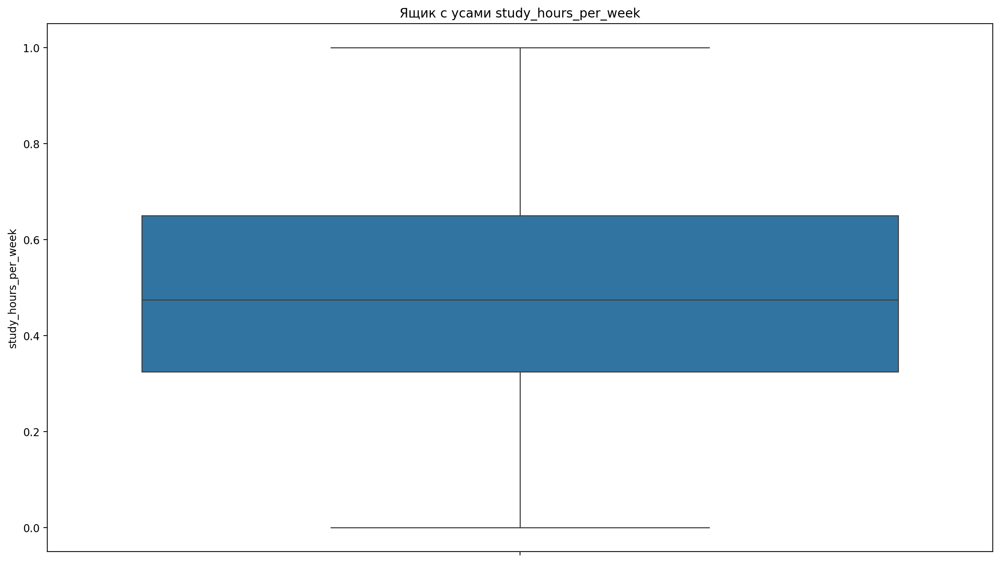

study_hours_per_week
min 0.0 - max 1.0
lower_bound: -0.16250000000000003 - 0 штук или 0.0%
upper_bound: 1.1375000000000002 - 0 штук или 0.0%
all_bound: -0.16250000000000003 - 1.1375000000000002. 0 штук или 0.0%


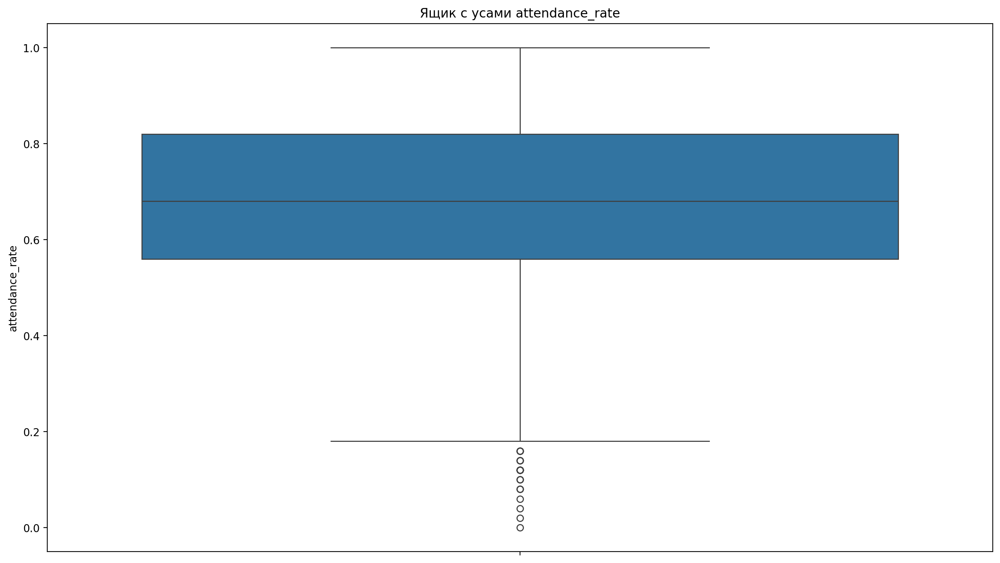

attendance_rate
min 0.0 - max 1.0
lower_bound: 0.17000000000000004 - 29 штук или 0.58%
upper_bound: 1.21 - 0 штук или 0.0%
all_bound: 0.17000000000000004 - 1.21. 29 штук или 0.58%


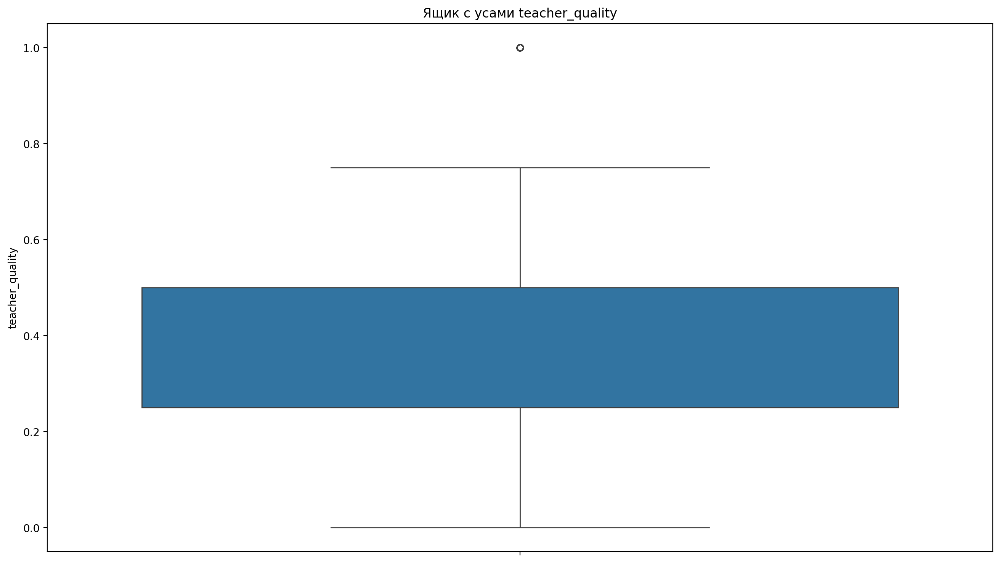

teacher_quality
min 0.0 - max 1.0
lower_bound: -0.125 - 0 штук или 0.0%
upper_bound: 0.875 - 115 штук или 2.3%
all_bound: -0.125 - 0.875. 115 штук или 2.3%


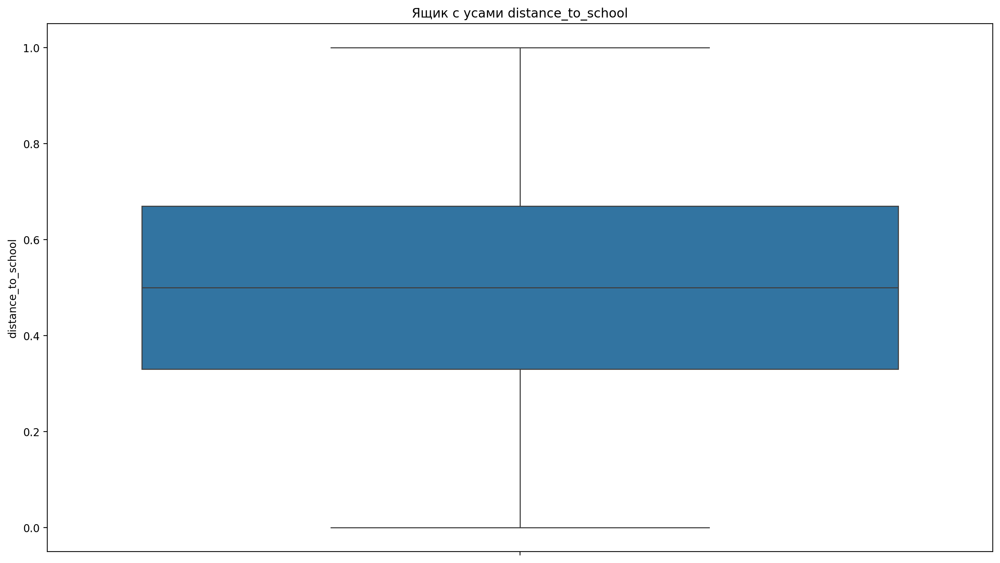

distance_to_school
min 0.0 - max 1.0
lower_bound: -0.18 - 0 штук или 0.0%
upper_bound: 1.1800000000000002 - 0 штук или 0.0%
all_bound: -0.18 - 1.1800000000000002. 0 штук или 0.0%


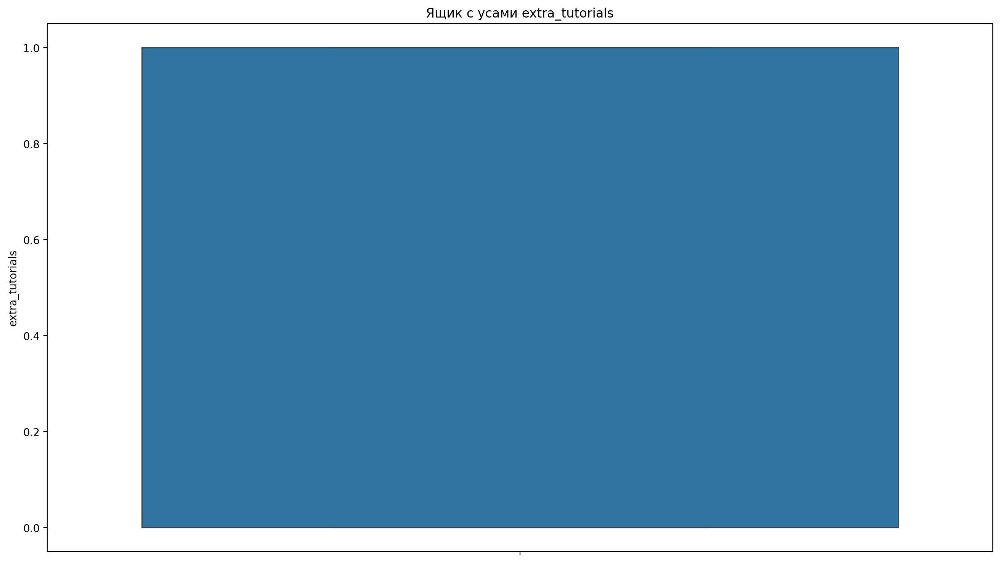

extra_tutorials
min 0.0 - max 1.0
lower_bound: -1.5 - 0 штук или 0.0%
upper_bound: 2.5 - 0 штук или 0.0%
all_bound: -1.5 - 2.5. 0 штук или 0.0%


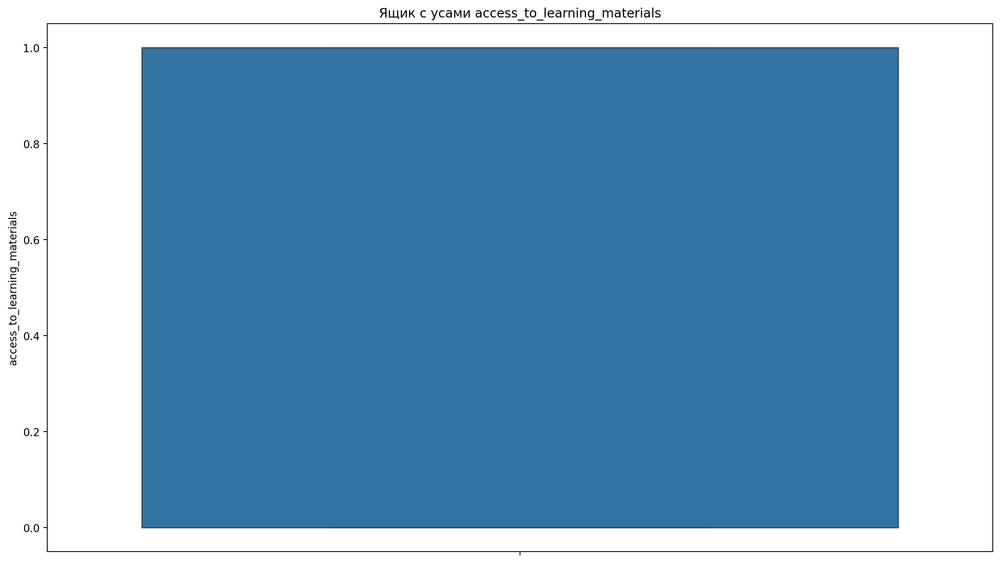

access_to_learning_materials
min 0.0 - max 1.0
lower_bound: -1.5 - 0 штук или 0.0%
upper_bound: 2.5 - 0 штук или 0.0%
all_bound: -1.5 - 2.5. 0 штук или 0.0%


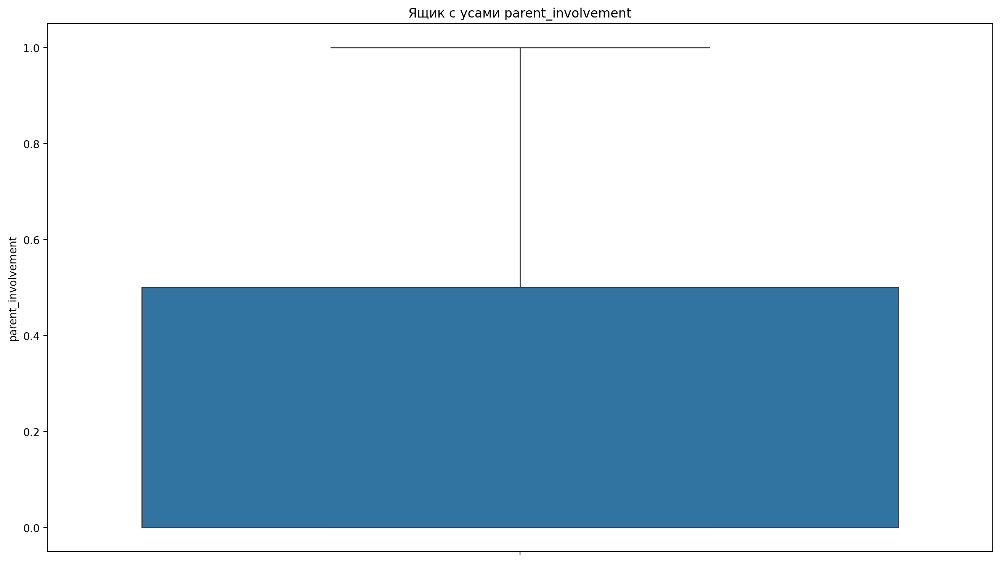

parent_involvement
min 0.0 - max 1.0
lower_bound: -0.75 - 0 штук или 0.0%
upper_bound: 1.25 - 0 штук или 0.0%
all_bound: -0.75 - 1.25. 0 штук или 0.0%


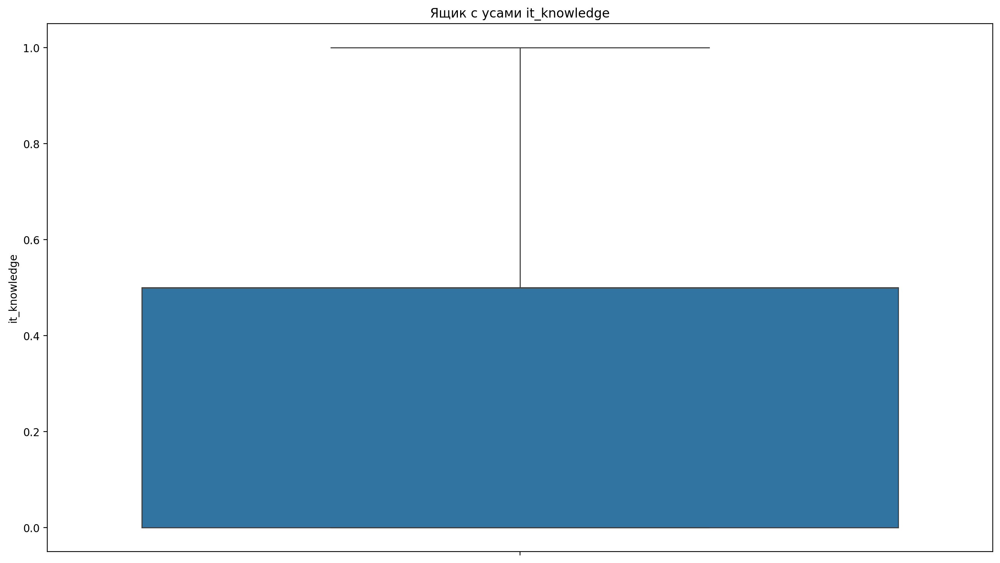

it_knowledge
min 0.0 - max 1.0
lower_bound: -0.75 - 0 штук или 0.0%
upper_bound: 1.25 - 0 штук или 0.0%
all_bound: -0.75 - 1.25. 0 штук или 0.0%


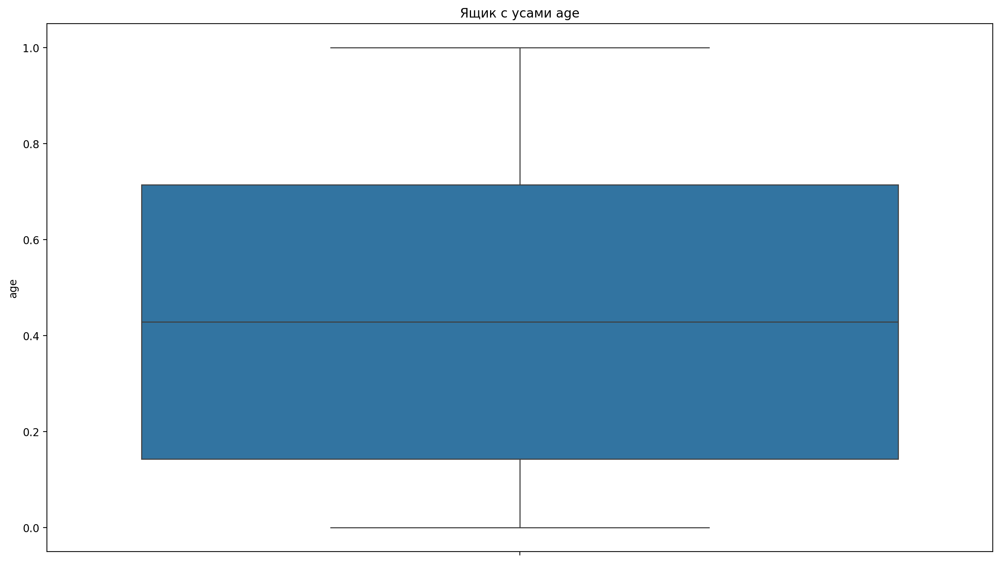

age
min 0.0 - max 1.0
lower_bound: -0.714285714285714 - 0 штук или 0.0%
upper_bound: 1.5714285714285707 - 0 штук или 0.0%
all_bound: -0.714285714285714 - 1.5714285714285707. 0 штук или 0.0%


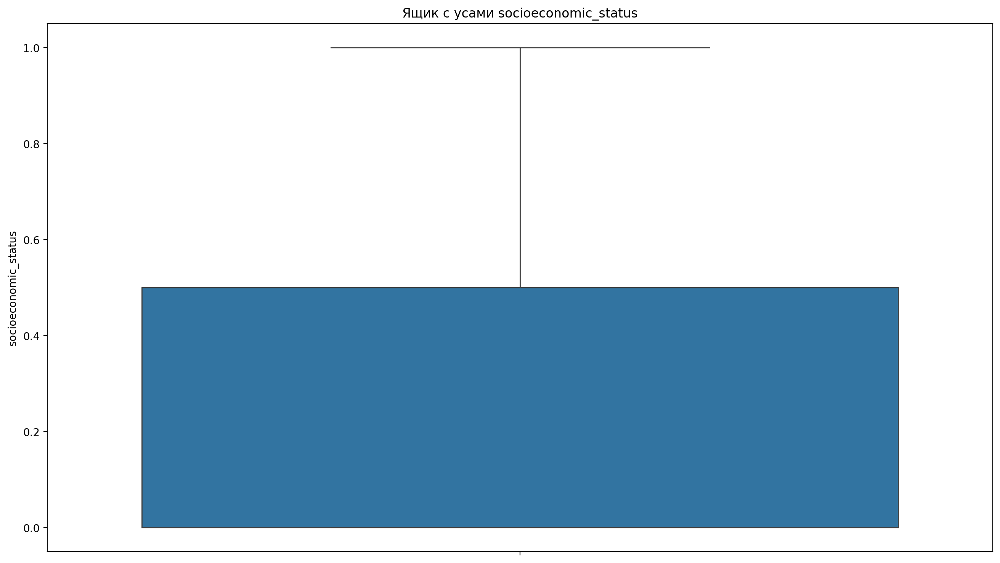

socioeconomic_status
min 0.0 - max 1.0
lower_bound: -0.75 - 0 штук или 0.0%
upper_bound: 1.25 - 0 штук или 0.0%
all_bound: -0.75 - 1.25. 0 штук или 0.0%


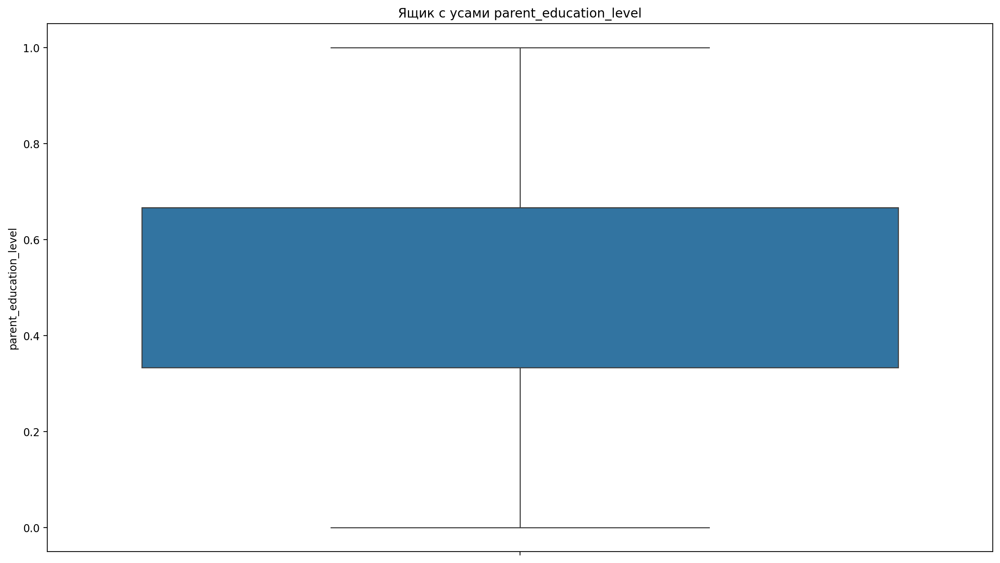

parent_education_level
min 0.0 - max 1.0
lower_bound: -0.16666666666666669 - 0 штук или 0.0%
upper_bound: 1.1666666666666665 - 0 штук или 0.0%
all_bound: -0.16666666666666669 - 1.1666666666666665. 0 штук или 0.0%


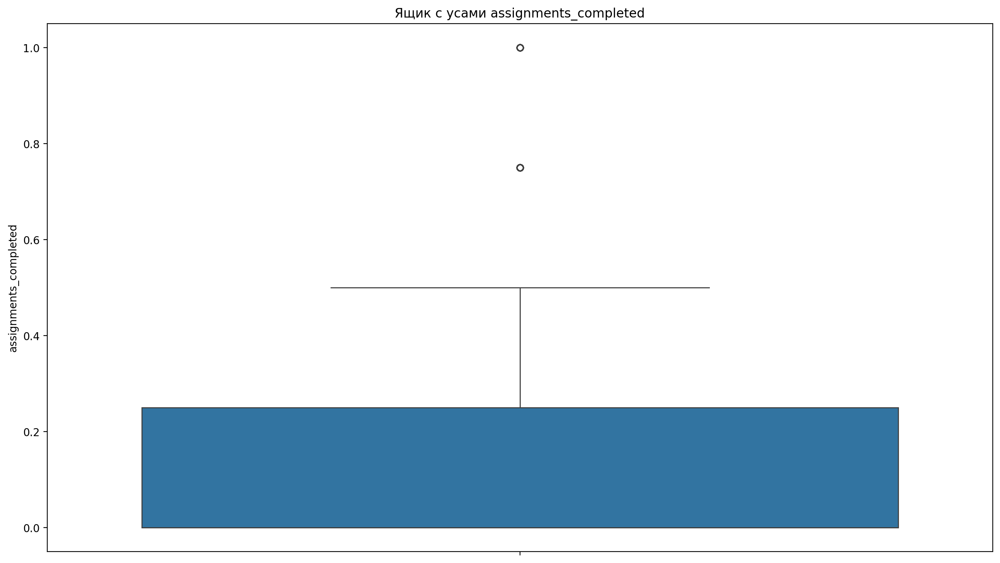

assignments_completed
min 0.0 - max 1.0
lower_bound: -0.375 - 0 штук или 0.0%
upper_bound: 0.625 - 378 штук или 7.56%
all_bound: -0.375 - 0.625. 378 штук или 7.56%


In [31]:
number_columns = jamb_2.select_dtypes(include=['number']).columns
size=jamb_2.count()[0]
for column in number_columns:
    plt.figure(figsize=(16,9))
    sns.boxplot(jamb_2[column]);
    plt.title(f'Ящик с усами {column}')
    plt.show()
        
    Q1 = jamb_2[column].quantile(0.25)
    Q3 = jamb_2[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    i=sum(jamb_2[column] < lower_bound)
    print(column)
    print(f'min {min(jamb_2[column])} - max {max(jamb_2[column])}')
    print(f'lower_bound: {lower_bound} - {i} штук или {round(i/size*100, 2)}%')
    j= sum(jamb_2[column] > upper_bound)
    print(f'upper_bound: {upper_bound} - {j} штук или {round(j/size*100, 2)}%')
    print(f'all_bound: {lower_bound} - {upper_bound}. {i+j} штук или {round((i+j)/size*100, 2)}%')


### Свармплоты распределения признаков

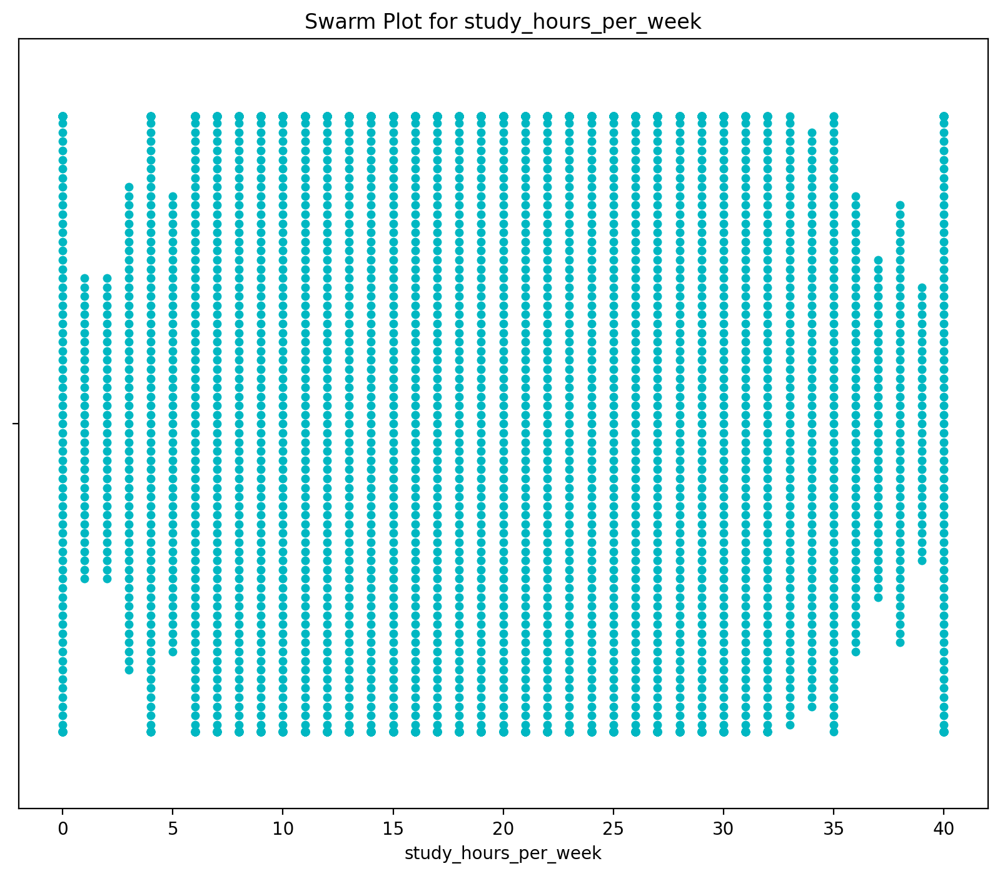

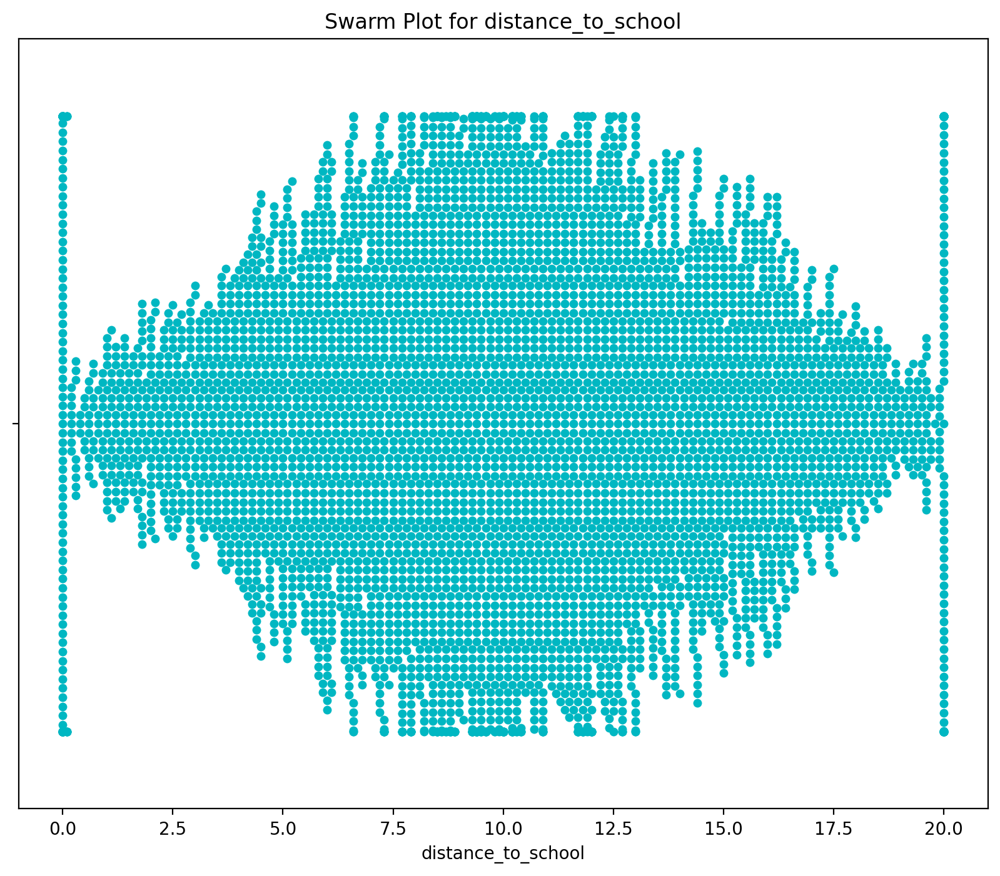

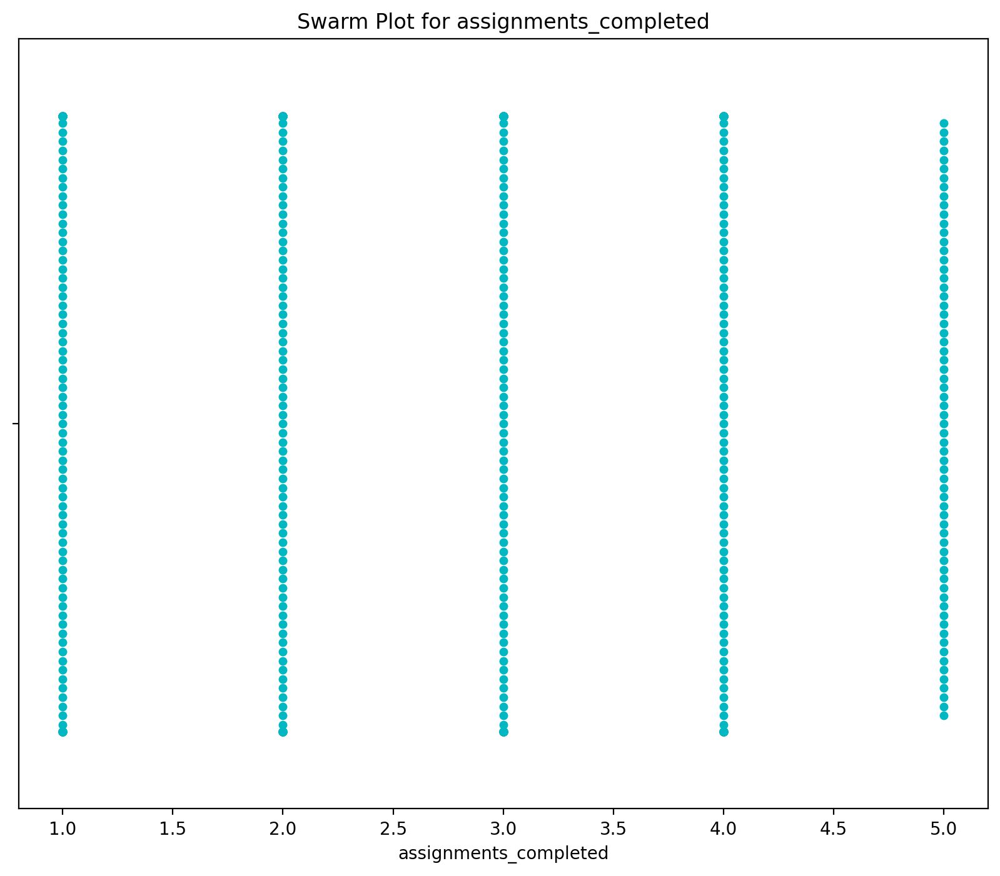

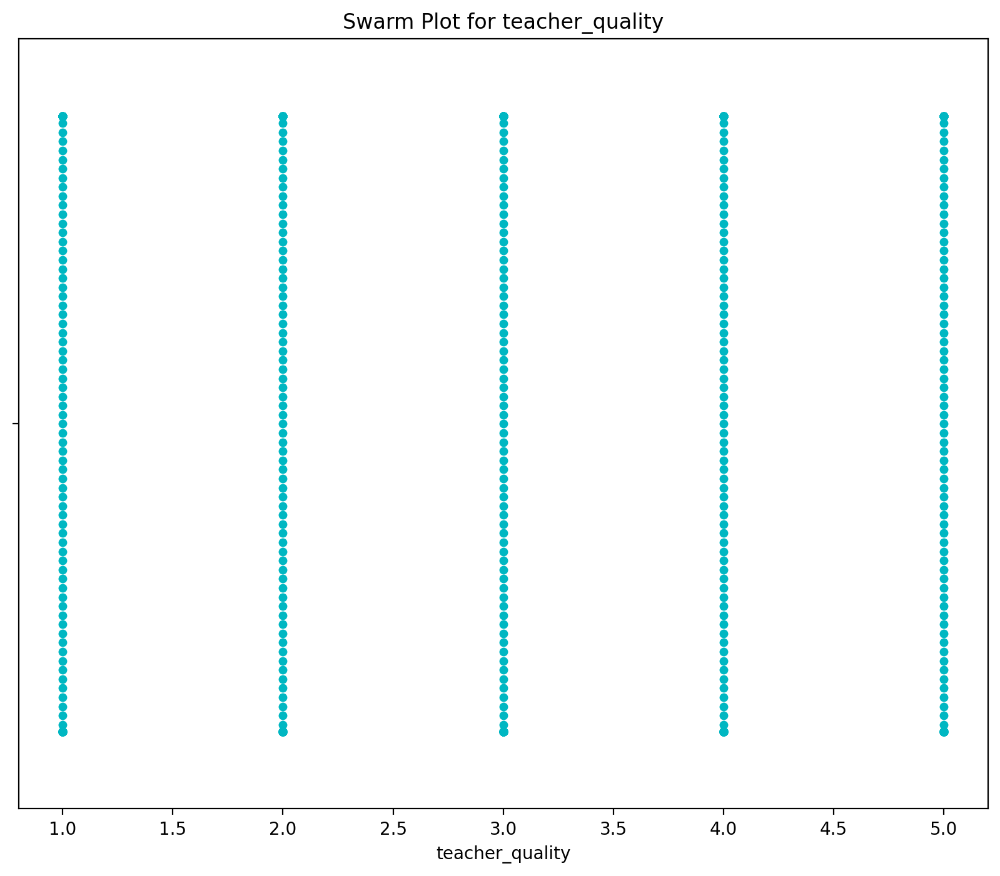

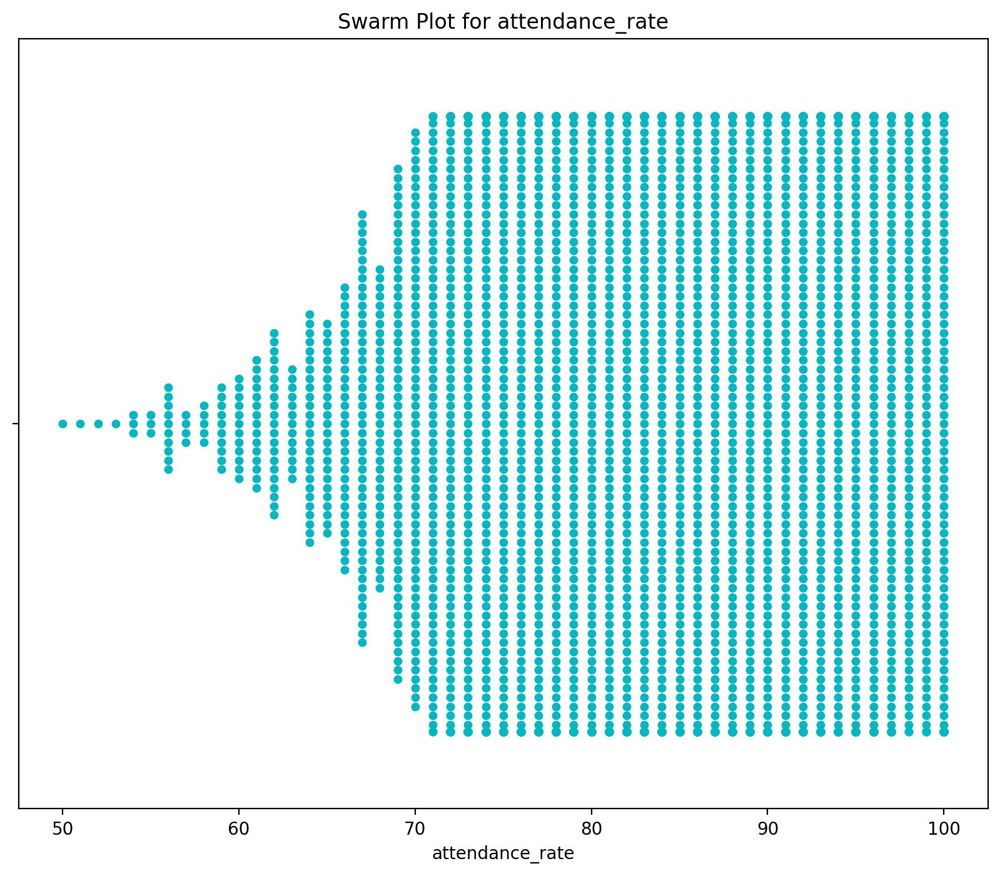

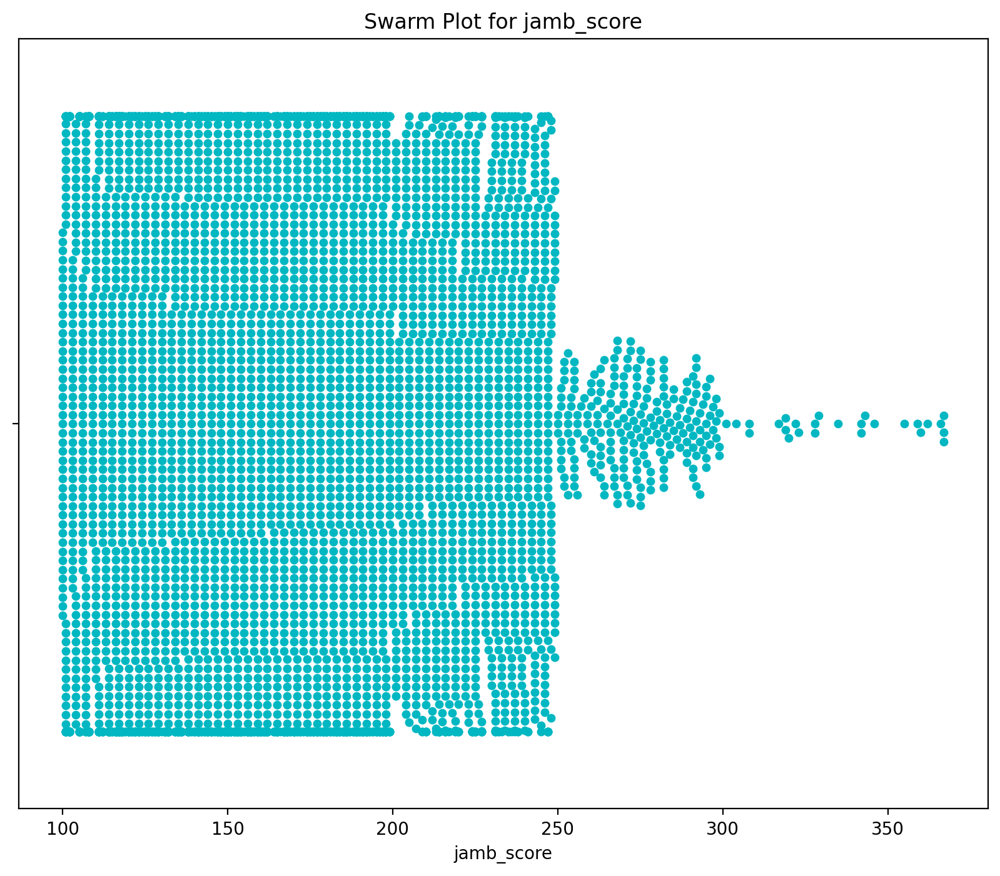

In [32]:
for i in (['study_hours_per_week', 'distance_to_school', 'assignments_completed', 'teacher_quality', 'attendance_rate', 'jamb_score']):
    plt.figure(figsize=(10, 8))
    sns.swarmplot(data=jamb, x=i,  color='#00b7c2')
    plt.title(f'Swarm Plot for {i}')
    plt.xlabel(i)
    plt.show()

In [33]:
sns.pairplot(jamb_2)
plt.suptitle('Pair Plot', y=1.02)
plt.show()
    